# Lakes - with salt

We consider the following predictive models:

* V15: Time varying ERA5 fields + the static V15 climate fields
* V20: Time varying ERA5 fields, the static V15 climate fields + V20 corrections to each of those fields + saline fields


We take 2016 as a training set, 2017 as a validation set and 2019 as a test set.


---


## 0. Global variables

First we will declare some variables, functions and useful calculations that will be shared among the sections below. If you just want to see the analysis, skip to `1.V15 vs V20`.

In [19]:
#VARIABLES

V15_model =  '/network/group/aopp/predict/TIP016_PAXTON_RPSPEEDY/ML4L/ECMWF_files/raw/processed_data/trained_models/V15_2016_augmented/'
V20_model =  '/network/group/aopp/predict/TIP016_PAXTON_RPSPEEDY/ML4L/ECMWF_files/raw/processed_data/trained_models/V20_2016_augmented_salt/'


#If the change in a variable is greater than tolerance (e.g. abs(cl) > tolerance), the change is marked as `significant`. 
#The "is significant"/"is not significant" boolean is then used is to define a grouping bitstring category.
#For lake depth dl, tolerance specifies the fracional change e.g. is the change in dl > 10%? 
tolerance = 0.1 


In [2]:
# FUNCTIONS
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import cartopy.crs as ccrs
import matplotlib.colors as mc
import matplotlib.colorbar as cb 
from scipy.stats import ttest_ind
import numpy as np
import seaborn as sns

def calculate_delta_field(filename,parameter):
    
    
    """
    Function to determine the change in a parameter when going from V15 to V20
    """
    
    root = '/network/group/aopp/predict/TIP016_PAXTON_RPSPEEDY/ML4L/ECMWF_files/raw/'
    version = ['v015', 'v020']
    
    ds = [] #Array to hold results
    for v in version:
        path = root+f'climate.{v}/climate.{v}/639l_2/{filename}'
        ds_i= xr.open_dataset(path,engine='cfgrib',backend_kwargs={'indexpath': ''},filter_by_keys={'shortName':parameter}) #only want this one parameter
        
        ds.append(ds_i)
        
    #Take the difference, and make it a nice pandas df    
    delta_field = ds[1] - ds[0] #V20 - V15
    delta_field =  delta_field.assign_coords({"longitude": (((delta_field.longitude + 180) % 360) - 180)}) #long3 ---> long1
    delta_field = delta_field.to_dataframe().reset_index()
    
    V20_df = ds[1].to_dataframe().reset_index()
    V15_df = ds[0].to_dataframe().reset_index()

    if parameter == '10si': #seaice shortname is inverse to variable name
        parameter='si10'
    
    delta_field[f'V15_{parameter}'] = V15_df[parameter]
    delta_field[f'V20_{parameter}'] = V20_df[parameter]
    delta_field = delta_field.rename(columns={f'{parameter}': f'change_in_{parameter}'})
    delta_field[f'percentage_change_in_{parameter}'] = (delta_field[f'V20_{parameter}'] - delta_field[f'V15_{parameter}']) / delta_field[f'V15_{parameter}']

    return delta_field


def plot_map(ds,z,vmin,vmax,cmap,logscale,title,limits,markersize,savefig):
    
    """Hacky function plotting the value of `z` at latitude/longitude points
       as a scatter map"""

    try:
        x = ds.longitude
        y = ds.latitude
    except: # different sources call lat/lon different things
        x = ds.longitude_ERA
        y = ds.latitude_ERA
    
    z1 = ds[z]
    

    
    #Setup figure and axes
    fig = plt.figure(figsize=[30,20])
    gs = GridSpec(1, 2, figure=fig, width_ratios=[50,1])
    ax = fig.add_subplot(gs[0], projection=ccrs.PlateCarree(central_longitude=0))
    cax = fig.add_subplot(gs[1])
    
    #Cmaps, normalisations
    if logscale:
        norm = mc.LogNorm(vmin=vmin, vmax=vmax)
        z1 = abs(z1)
    else:
        norm = mc.Normalize(vmin=vmin, vmax=vmax)

    
    cb1 = cb.ColorbarBase(cax, cmap=cmap,
                                norm=norm,
                                orientation='vertical')
    
    
    
    #Plot it
    sc=ax.scatter(x,y,s=markersize,c=cmap(norm(z1)),
                linewidths=1, alpha=.7)

    
    #Tidy up
    ax.axhline(70, c='0.5', linestyle='--')
    ax.axhline(-70, c='0.5', linestyle='--') #latitude cutoffs

    ax.set_title(title,fontsize=30)    
    ax.coastlines()

    
    ax.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
    ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=ccrs.PlateCarree())
    ax.set_aspect('auto') #Force projection aspect ratio
    
    if limits is not None:
        ax.set_xlim(limits['xlow'],limits['xhigh'])
        ax.set_ylim(limits['ylow'],limits['yhigh'])
        ax.set_xticks([])
        ax.set_yticks([])
        
    if savefig is not None:
        plt.savefig(savefig,bbox_inches='tight', pad_inches=0, dpi=300)

    plt.show()
    
    
    
    
    
def load_predictions(model):

    """For this model, load the predictions and determine the prediction error"""
    
    df = pd.read_parquet(model+'predictions.parquet')
    
    #Calculate some extra columns
    df['predicion_bias'] = df.MODIS_LST - df.predictions
    df['predicion_error'] = abs(df.MODIS_LST - df.predictions)


    print("Mean/Median/Std prediction bias:", df['predicion_bias'].mean(), df['predicion_bias'].median(),df['predicion_bias'].std())
    print("Mean/Median/Std prediction error:", df['predicion_error'].mean(), df['predicion_error'].median(),df['predicion_error'].std())

    #Average predictions and errors over the year
    df_grouped = df.groupby(['latitude_ERA', 'longitude_ERA'],as_index=False).mean() 


    return df,df_grouped



def plot_distribution(df,x,xlabel):
    

    """Plot the distribution of the quantity `x` in df """

    #Setup plot env
    h,w = 20,20
    sns.set_theme(context='talk', 
                  style='ticks', 
                  palette='deep',
                  rc={'figure.figsize':(h,w)}
                  )
    #Figure
    fig, ax1 = plt.subplots(nrows=1, ncols=1, figsize=(h,w))
    sns.histplot(df[x], bins='auto', ax=ax1,stat='probability',kde=False,alpha=0.7,color='C0')

    # Config
    ax1.set_xlabel(xlabel)

    ax1.axvline(0,c='0.5', linestyle='--')
    
    #Prints
    print ('Number of samples:', len(df))
    print ('Distribution Mean/Median:', df[x].mean(), df[x].median())

    plt.show()
    
    
    
    
    
    
    
#-------------------------------------
    
def classify(x,tol):
    
    if abs(x) > tol:
        return True
    else:
        return False
    
def classify_dl(x,tol):
    
    if abs(x) > tol:
        return True
    else:
        return False
    
    
        
def bit(x):
    
    if x:
        return 1
    else:
        return 0


def bitstring(list_of_columns):
    
    bitstring=''
    for i in list_of_columns:
        idx = bit(i)
        bitstring += str(idx)
        
    return bitstring
    
#-------------------------------------
    
def significance_test(v1,v2):
    try:
        return ttest_ind(v1, v2)
    except:
        return np.nan

def significance_boolean(x):
    
    try:
        pval = x[-1]
    except:
        #Nans are not subscriptable
        return 'Insignificant'
    
    if (pval > 0.01) or np.isnan(pval): 
        return 'Insignificant'
    else:
        return 'Significant'

    

In [3]:
#CALCULATIONS

#Calculate all the delta fields i.e. the change in parameter V15-->V20
clake_delta_field  = calculate_delta_field('clake','cl')        #How does cl change?
seaice_delta_field = calculate_delta_field('cicecap','10si')    #How does seaice change
cvh_delta_field    = calculate_delta_field('cvh','cvh')         #How does cvh change?
cvl_delta_field    = calculate_delta_field('cvl','cvl')         #How does cvl change
lsm_delta_field    = calculate_delta_field('lsmoro','lsm')      #How does lsm change?
dl_delta_field     = calculate_delta_field('lakedl','dl')      #How does lake depth change?

#Bring all the delta fields together
change_in_fields = pd.concat([clake_delta_field,seaice_delta_field,cvh_delta_field,cvl_delta_field,lsm_delta_field,dl_delta_field],axis=1)
change_in_fields = change_in_fields.loc[:,~change_in_fields.columns.duplicated()] #remove duplicated column names that arise due to the concat


# Classify every grid point according to the delta fields
# First create extra boolean columns for whether the change in the field is significant, where significane is determined by `tolerance`     
for parameter in ['cl','si10','cvh','cvl','lsm']:
    change_in_fields[f'{parameter}_change_is_significant'] = change_in_fields.apply(lambda x : classify(x[f'change_in_{parameter}'],tolerance), axis = 1)
    
#handle dl separatley since this is not a fractional 0-1 features
change_in_fields[f'dl_change_is_significant'] = change_in_fields.apply(lambda x : classify_dl(x[f'change_in_dl']/x[f'V15_dl'],tolerance), axis = 1)
    

    
# Then create a single group bitstring for all combinations of booleans
change_in_fields[f'bitstring'] = change_in_fields.apply(lambda x : bitstring( [x['cl_change_is_significant'],
                                                                               x['cvh_change_is_significant'],
                                                                               x['cvl_change_is_significant'],
                                                                               x['dl_change_is_significant'],
                                                                               x['lsm_change_is_significant'],
                                                                               x['si10_change_is_significant']    # ALPHABETICAL
                                                                              ]
                                                                               ), axis = 1)

In [4]:
display_table = change_in_fields.groupby(['bitstring']).count()[['values']]
display_table = display_table.rename(columns={"values": "Number of Pixels"})
display(display_table.sort_values(by='Number of Pixels',ascending=False))

,Number of Pixels
bitstring,
000000,362608
000100,170901
000101,2661
100100,2488
100110,1715
000110,489
000111,359
100000,240
100010,119


---


## 1. V15 vs V20 <a name="V15V20"></a>

In [20]:
V15_predictions,V15_predictions_averaged = load_predictions(V15_model)
V20_predictions,V20_predictions_averaged = load_predictions(V20_model)

Mean/Median/Std prediction bias: -0.041747708 0.10055542 4.081224
Mean/Median/Std prediction error: 3.0393808 2.3208313 2.7240207
Mean/Median/Std prediction bias: -0.06906719 0.06326294 4.0046215
Mean/Median/Std prediction error: 2.9820101 2.2740173 2.673836


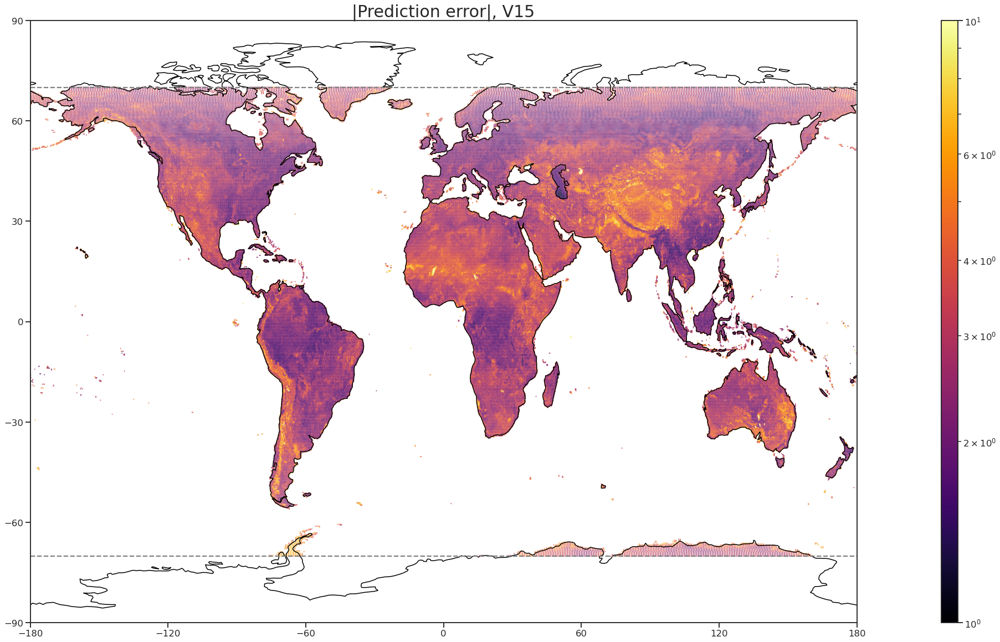

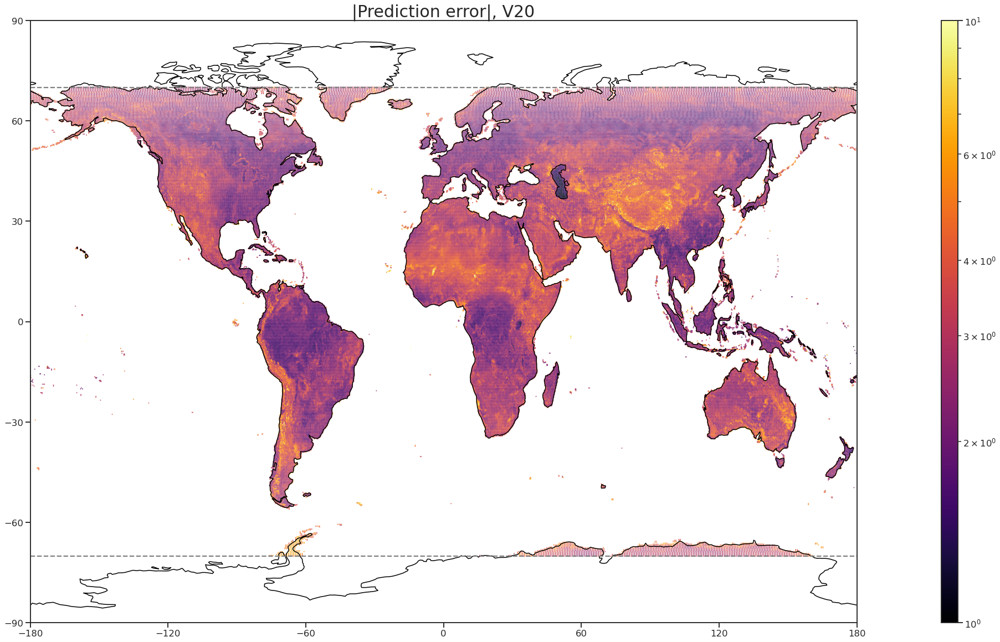

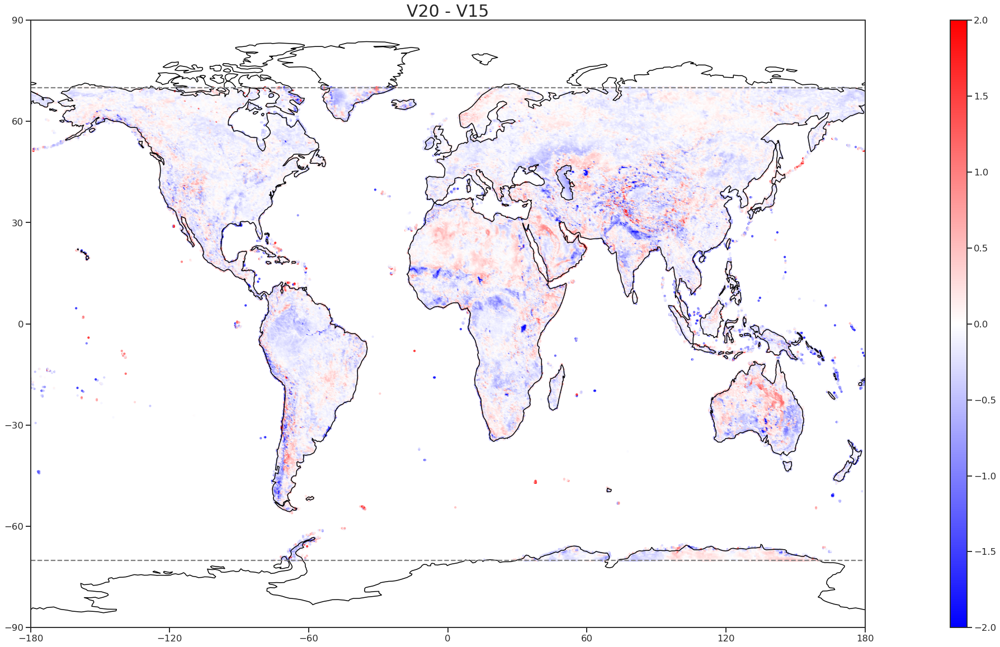

In [21]:
#Plot the map of the prediction error  
cmap = plt.cm.inferno
logscale = True #None
vmin = 1
vmax = 10
plot_map(V15_predictions_averaged,'predicion_error',vmin=vmin,vmax=vmax,cmap=cmap,logscale=logscale,title='|Prediction error|, V15',limits=None,markersize=1,savefig=None)
plot_map(V20_predictions_averaged,'predicion_error',vmin=vmin,vmax=vmax,cmap=cmap,logscale=logscale,title='|Prediction error|, V20',limits=None,markersize=1,savefig=None)

    
#Create a new df that will just hold the differences, and plot it    
data = {'latitude_ERA':   V20_predictions_averaged.latitude_ERA, 
        'longitude_ERA':  V20_predictions_averaged.longitude_ERA,
        'MODIS_LST':      V20_predictions_averaged.MODIS_LST,
        'V15_prediction': V15_predictions_averaged.predictions,
        'V20_prediction': V20_predictions_averaged.predictions,
        'V15_error':      V15_predictions_averaged.predicion_error,
        'V20_error':      V20_predictions_averaged.predicion_error,
        'delta':          V20_predictions_averaged.predicion_error - V15_predictions_averaged.predicion_error}
V20_V15 = pd.DataFrame(data)    
plot_map(V20_V15,'delta',vmin=-2,vmax=+2,cmap=plt.cm.bwr,logscale=False,title='V20 - V15',limits=None,markersize=10,savefig=None)

### 1A. Apply "change in lake cover" mask
Apply a mask to look only at those points where `cl` changed appreciably

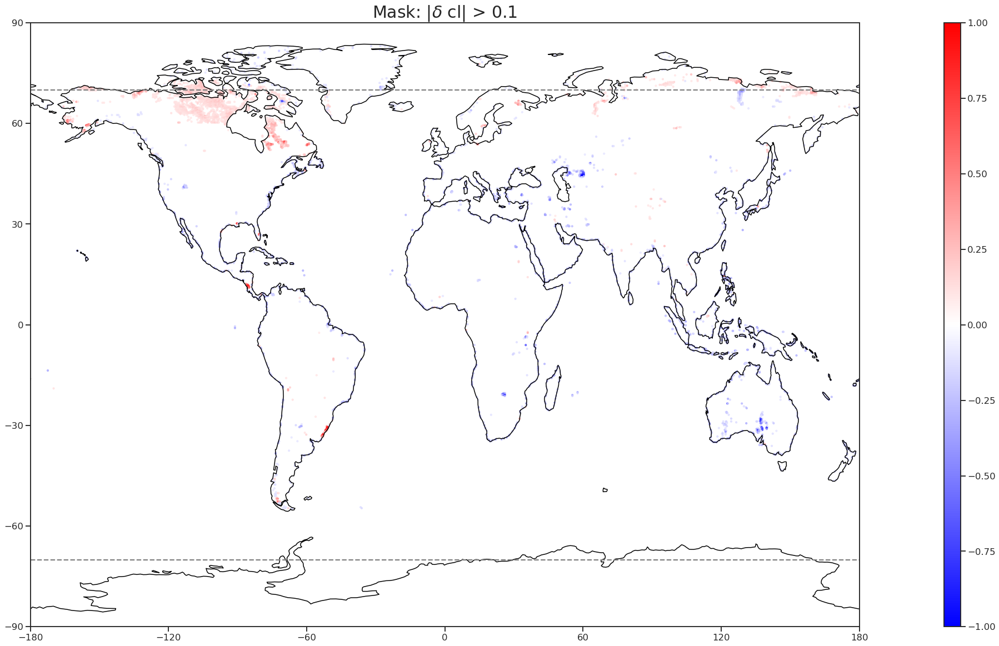

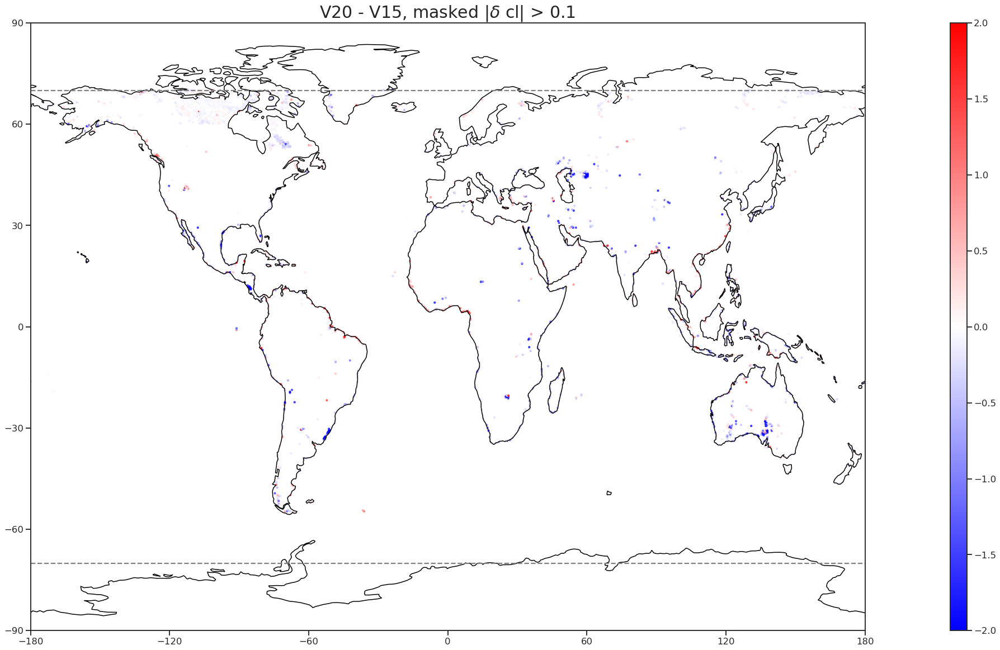

Number of samples: 4314
Distribution Mean/Median: -0.1782471 -0.041799307


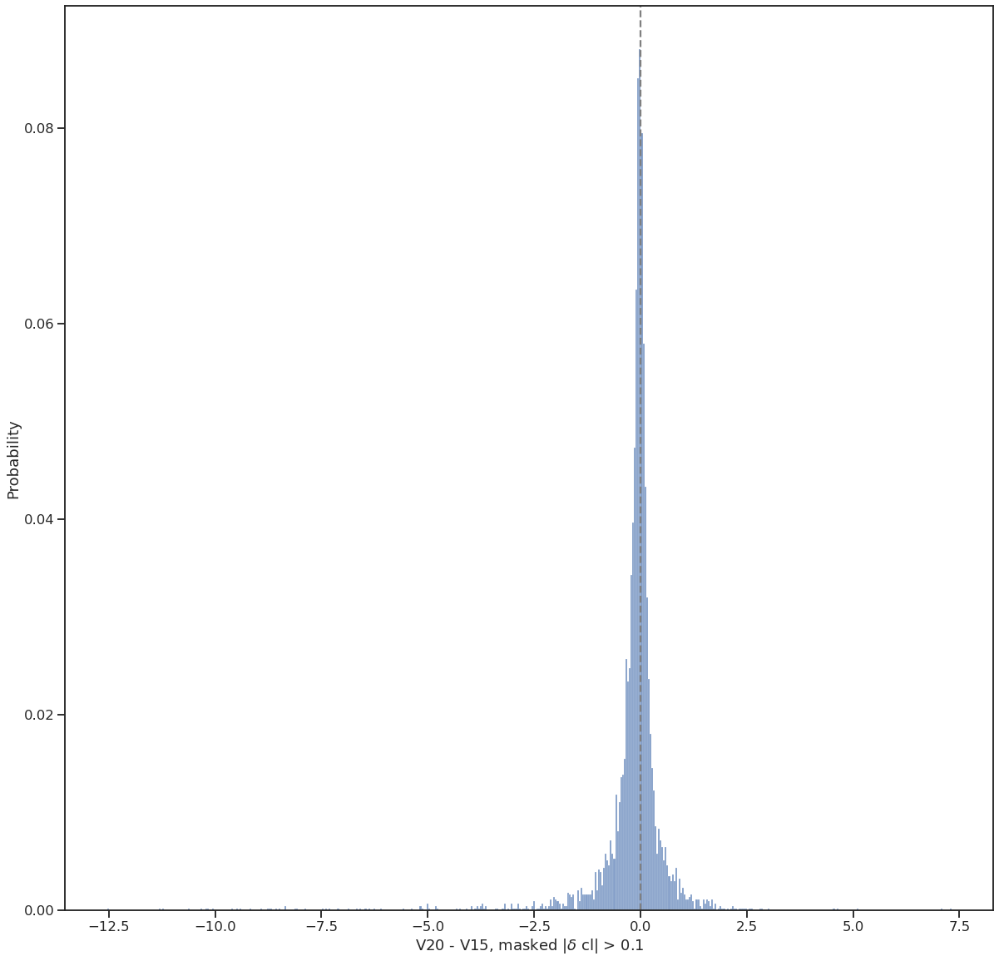

Masked points:


,latitude_ERA,longitude_ERA,MODIS_LST,V15_prediction,V20_prediction,V15_error,V20_error,delta,values,step,...,V15_dl,V20_dl,percentage_change_in_dl,cl_change_is_significant,si10_change_is_significant,cvh_change_is_significant,cvl_change_is_significant,lsm_change_is_significant,dl_change_is_significant,bitstring
1750,24.028095,69.00000,313.732483,309.048828,300.861755,5.621420,12.932500,7.311080,162045,0 days,...,2.580078,3.755859,0.455715,True,False,False,False,True,True,100110
780,-6.323183,-80.71875,311.564301,308.391449,300.196777,4.953901,12.050627,7.096725,300193,0 days,...,12.924805,30.428711,1.354288,True,False,False,False,True,True,100110
1811,25.995308,56.10000,310.809784,310.621185,319.346130,3.410573,8.536351,5.125778,153602,0 days,...,34.668945,25.713867,-0.258303,True,False,False,False,False,True,100100
3396,63.934391,-107.40000,262.330750,263.822906,269.502136,2.599759,7.210188,4.610429,28589,0 days,...,41.000000,10.000000,-0.756098,True,False,False,True,True,True,101110
781,-6.323183,-80.43750,314.165771,311.336700,306.066101,4.109239,8.672022,4.562783,300194,0 days,...,25.000000,14.855469,-0.405781,True,False,False,False,True,True,100110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2424,44.543308,60.00000,305.281464,291.173187,302.041290,14.396216,4.066753,-10.329463,82329,0 days,...,7.302734,1.000000,-0.863065,True,False,False,False,True,True,100110
339,-28.524581,137.50000,314.010529,297.675995,309.109924,16.346096,5.728867,-10.617229,398609,0 days,...,4.690430,1.000000,-0.786800,True,False,False,False,True,True,100110
268,-30.772823,139.84000,311.227539,296.724213,309.979401,14.503330,3.297713,-11.205617,407795,0 days,...,4.690430,1.000000,-0.786800,True,False,False,False,True,True,100110
338,-28.524581,137.18750,312.487457,295.952759,309.089874,16.549955,5.254853,-11.295102,398608,0 days,...,4.690430,1.000000,-0.786800,True,False,False,False,True,True,100110


Classification table:


,Number of Pixels,AverageDelta,Percentage,"Stats (t-statistic,p-value)",Significant Change?
bitstring,,,,,
100000,234,-0.221656,5.424200,"(2.3230509171416722, 0.02060603574704391)",Insignificant
100010,104,-0.171680,2.410756,"(1.520469181707269, 0.12992649246739518)",Insignificant
100011,3,-0.279088,0.069541,"(0.4146916326565311, 0.6996432567366341)",Insignificant
100100,2392,-0.071218,55.447381,"(2.8848562066123242, 0.003933432248482765)",Significant
100101,19,0.031509,0.440427,"(-0.09980482129264749, 0.9210530103965875)",Insignificant
100110,1512,-0.359805,35.048679,"(6.890228117287321, 6.751058658371522e-12)",Significant
100111,17,-0.137471,0.394066,"(0.5916747767365772, 0.558225620008127)",Insignificant
101010,2,-0.106391,0.046361,"(0.14368120749922822, 0.8989223735089011)",Insignificant
101100,8,0.712589,0.185443,"(-2.5360649620971474, 0.023750331709367994)",Insignificant


-----------------------------------------------------------


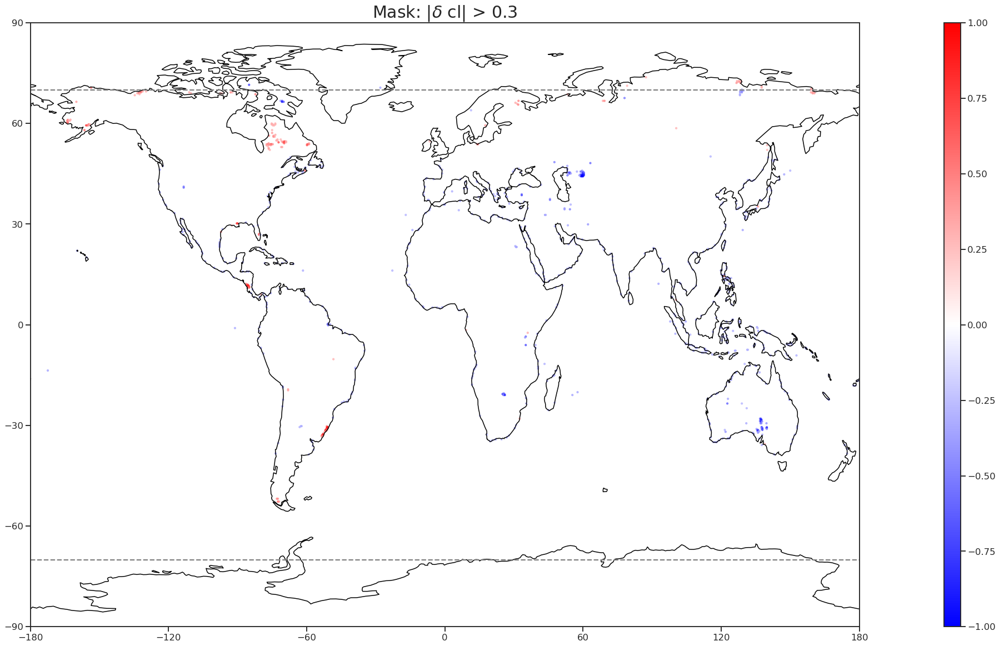

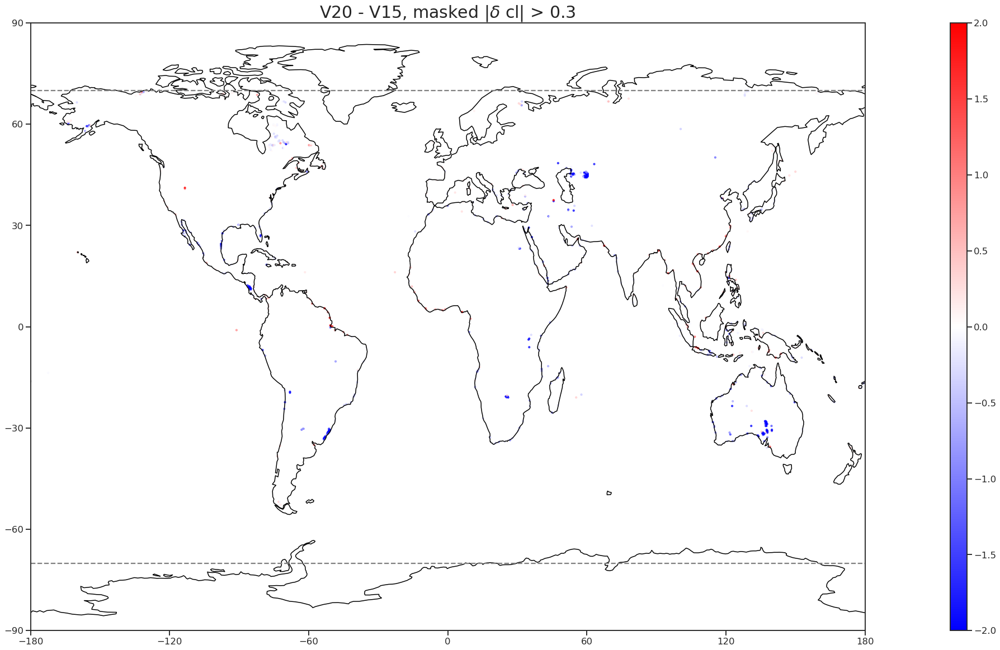

Number of samples: 908
Distribution Mean/Median: -0.65216833 -0.14819252


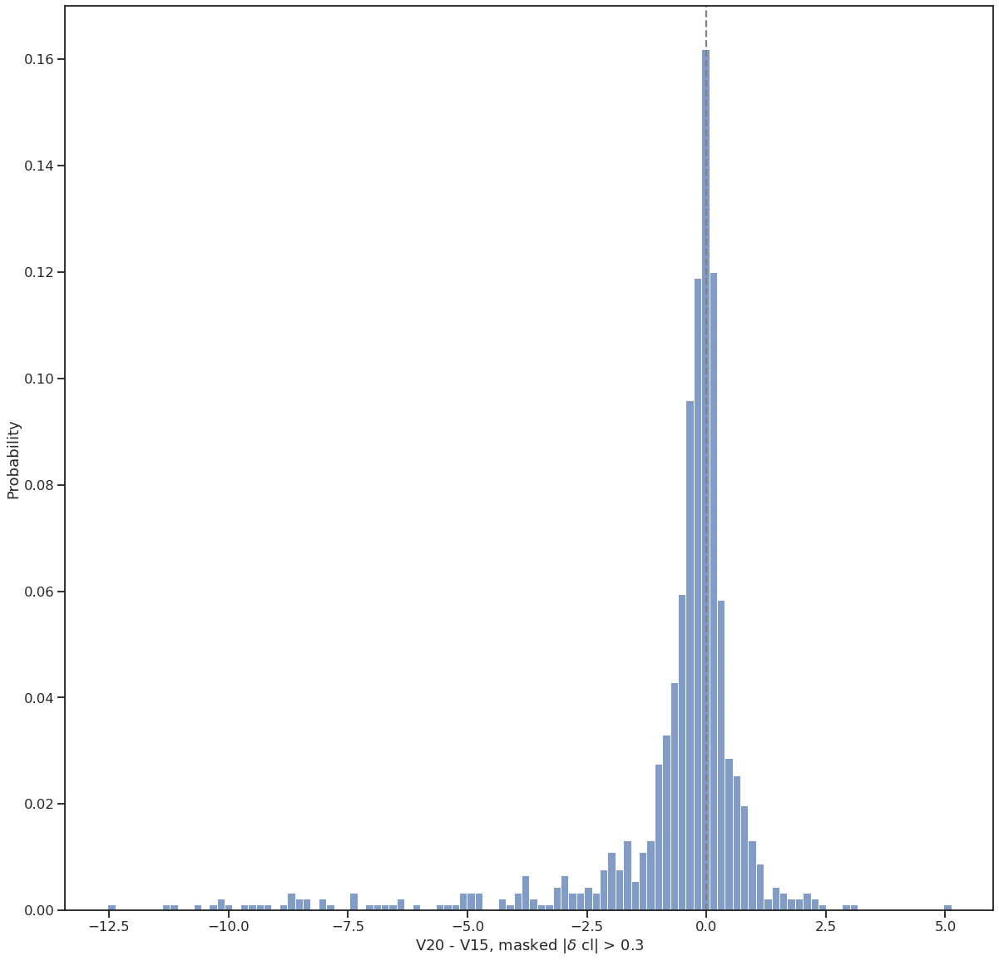

Masked points:


,latitude_ERA,longitude_ERA,MODIS_LST,V15_prediction,V20_prediction,V15_error,V20_error,delta,values,step,...,V15_dl,V20_dl,percentage_change_in_dl,cl_change_is_significant,si10_change_is_significant,cvh_change_is_significant,cvl_change_is_significant,lsm_change_is_significant,dl_change_is_significant,bitstring
543,25.995308,56.100000,310.809784,310.621185,319.346130,3.410573,8.536351,5.125778,153602,0 days,...,34.668945,25.713867,-0.258303,True,False,False,False,False,True,100100
234,-6.323183,108.000000,306.251099,307.055206,311.635590,2.402908,5.433572,3.030665,299584,0 days,...,2.719727,8.601562,2.162657,True,False,False,False,False,True,100100
687,41.170945,-113.400000,294.736176,294.245392,300.643982,3.573472,6.439048,2.865576,94518,0 days,...,3.000000,27.000000,8.000000,True,False,False,False,True,True,100110
500,22.622944,90.962963,300.629913,304.417236,306.837372,3.837865,6.212008,2.374143,168122,0 days,...,5.011719,12.028320,1.400039,True,False,False,False,False,True,100100
648,37.517551,45.666667,295.457550,295.205109,299.419373,2.714986,5.056190,2.341204,107274,0 days,...,9.857422,5.000000,-0.492768,True,False,False,False,True,True,100110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,44.543308,60.000000,305.281464,291.173187,302.041290,14.396216,4.066753,-10.329463,82329,0 days,...,7.302734,1.000000,-0.863065,True,False,False,False,True,True,100110
100,-28.524581,137.500000,314.010529,297.675995,309.109924,16.346096,5.728867,-10.617229,398609,0 days,...,4.690430,1.000000,-0.786800,True,False,False,False,True,True,100110
76,-30.772823,139.840000,311.227539,296.724213,309.979401,14.503330,3.297713,-11.205617,407795,0 days,...,4.690430,1.000000,-0.786800,True,False,False,False,True,True,100110
99,-28.524581,137.187500,312.487457,295.952759,309.089874,16.549955,5.254853,-11.295102,398608,0 days,...,4.690430,1.000000,-0.786800,True,False,False,False,True,True,100110


Classification table:


,Number of Pixels,AverageDelta,Percentage,"Stats (t-statistic,p-value)",Significant Change?
bitstring,,,,,
100000,85,-0.528997,9.361233,"(2.6952282456905965, 0.007749234291724905)",Significant
100010,3,-2.486123,0.330396,"(1.254329874871819, 0.27801909836651684)",Insignificant
100100,668,-0.188953,73.568282,"(3.588811079207978, 0.00034422144809196183)",Significant
100110,141,-2.959861,15.528634,"(8.141719656641378, 1.2931500118510092e-14)",Significant
101100,4,0.342664,0.440529,"(-1.334527147315729, 0.23044120676474517)",Insignificant
101110,7,0.349255,0.770925,"(-0.5524111673772055, 0.59080770950299)",Insignificant


-----------------------------------------------------------


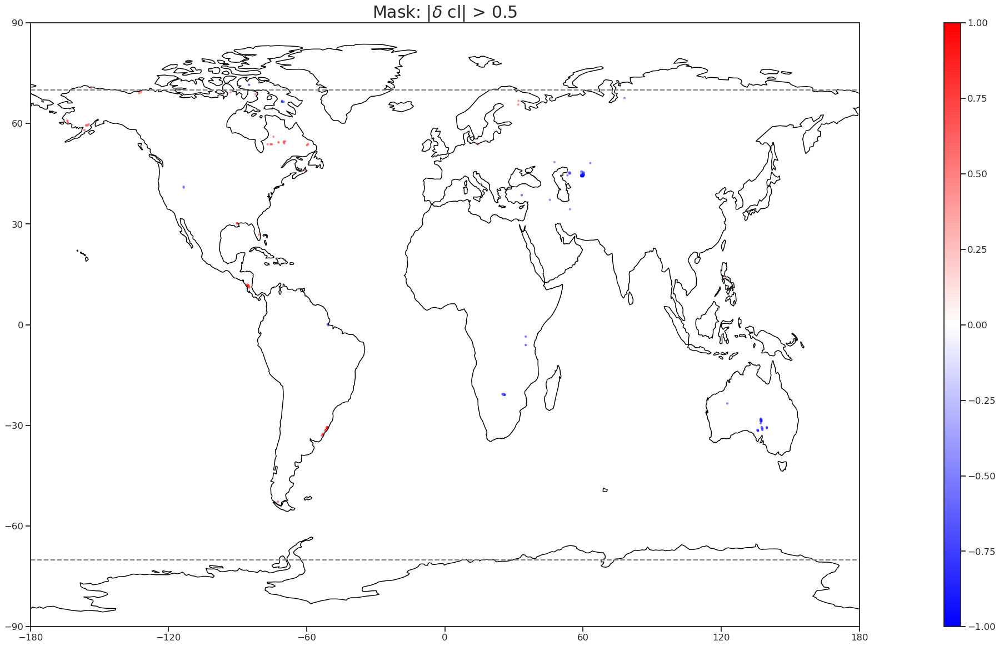

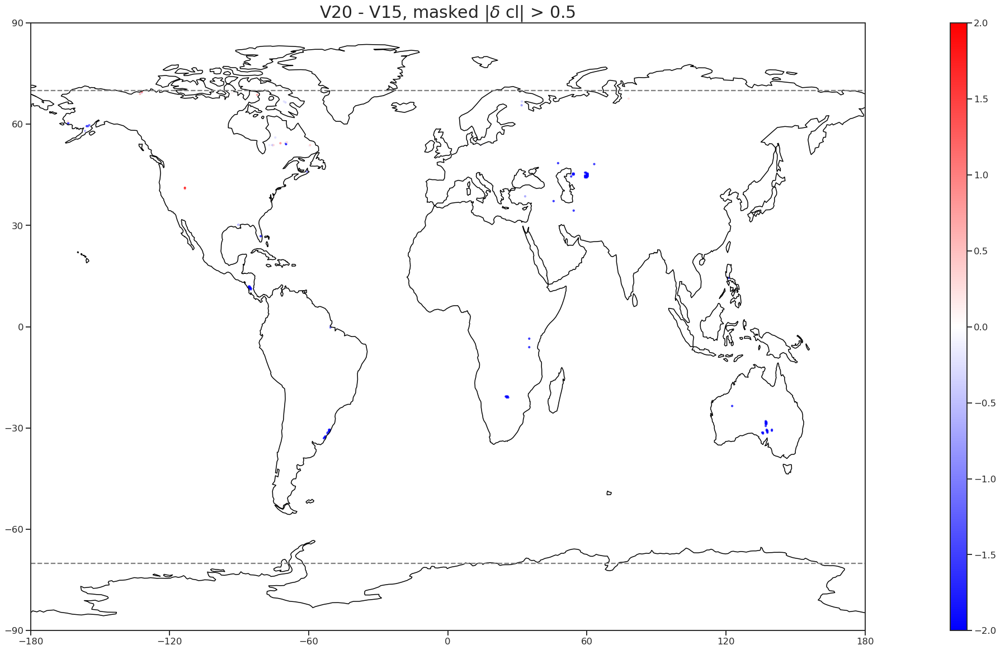

Number of samples: 115
Distribution Mean/Median: -3.8793783 -3.1788108


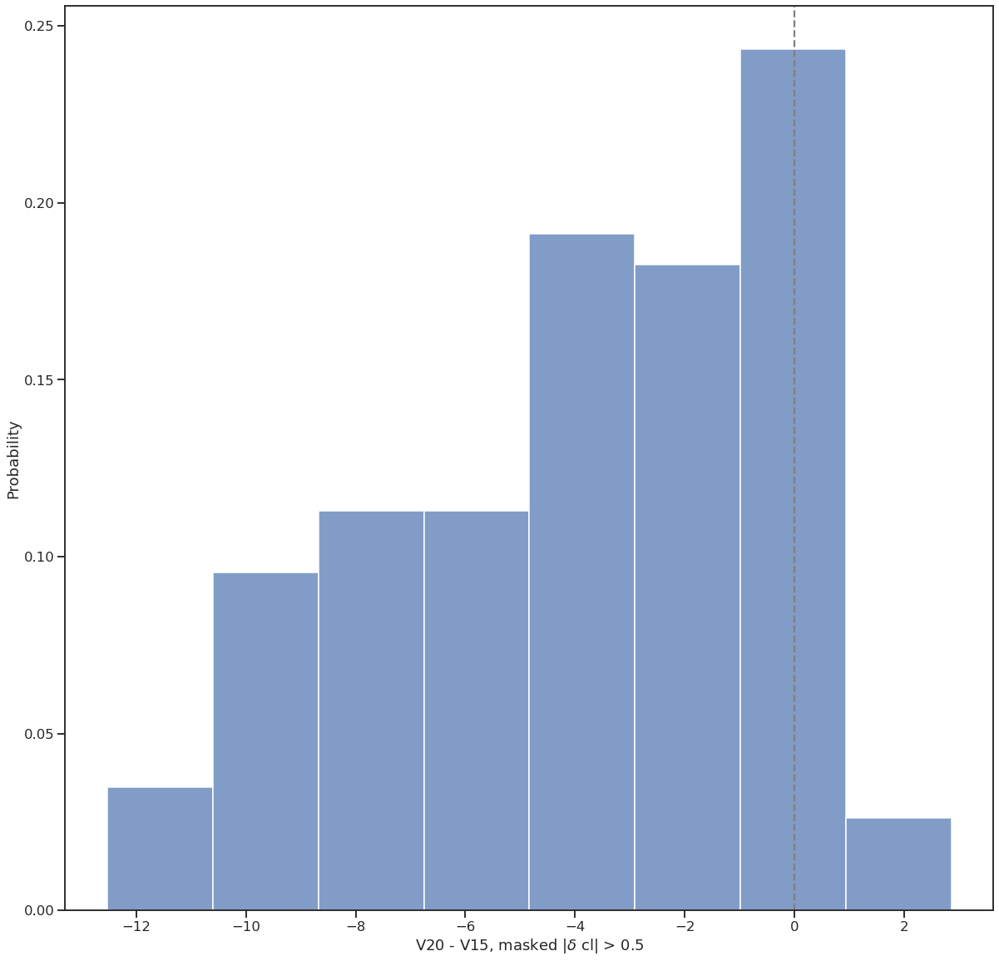

Masked points:


,latitude_ERA,longitude_ERA,MODIS_LST,V15_prediction,V20_prediction,V15_error,V20_error,delta,values,step,...,V15_dl,V20_dl,percentage_change_in_dl,cl_change_is_significant,si10_change_is_significant,cvh_change_is_significant,cvl_change_is_significant,lsm_change_is_significant,dl_change_is_significant,bitstring
62,41.170945,-113.400000,294.736176,294.245392,300.643982,3.573472,6.439048,2.865576,94518,0 days,...,3.000000,27.000000,8.000000,True,False,False,False,True,True,100110
114,69.554988,-132.000000,264.062286,265.036407,267.322296,2.555805,3.731957,1.176152,17866,0 days,...,25.000000,2.639648,-0.894414,True,False,False,True,True,True,101110
94,54.379367,-72.187500,268.016693,269.082092,271.395782,3.349535,4.315793,0.966259,52171,0 days,...,25.000000,10.000000,-0.600000,True,False,False,True,True,True,101110
61,40.889915,-113.400000,296.116394,293.964203,299.986816,3.979623,4.880910,0.901288,95518,0 days,...,3.000000,27.000000,8.000000,True,False,False,False,True,True,100110
110,68.711899,-82.222222,260.665619,261.293121,263.610504,2.918608,3.763737,0.845129,19377,0 days,...,25.000000,9.800781,-0.607969,True,False,False,True,False,True,101100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,44.543308,60.000000,305.281464,291.173187,302.041290,14.396216,4.066753,-10.329463,82329,0 days,...,7.302734,1.000000,-0.863065,True,False,False,False,True,True,100110
29,-28.524581,137.500000,314.010529,297.675995,309.109924,16.346096,5.728867,-10.617229,398609,0 days,...,4.690430,1.000000,-0.786800,True,False,False,False,True,True,100110
20,-30.772823,139.840000,311.227539,296.724213,309.979401,14.503330,3.297713,-11.205617,407795,0 days,...,4.690430,1.000000,-0.786800,True,False,False,False,True,True,100110
28,-28.524581,137.187500,312.487457,295.952759,309.089874,16.549955,5.254853,-11.295102,398608,0 days,...,4.690430,1.000000,-0.786800,True,False,False,False,True,True,100110


Classification table:


,Number of Pixels,AverageDelta,Percentage,"Stats (t-statistic,p-value)",Significant Change?
bitstring,,,,,
100000,15,-2.599724,13.043478,"(4.928445124535897, 3.372695908885214e-05)",Significant
100010,2,-3.765257,1.739130,"(1.6091352445279994, 0.24886403835964635)",Insignificant
100100,37,-1.647784,32.173913,"(5.970230302651193, 8.18463908439115e-08)",Significant
100110,55,-6.220858,47.826087,"(12.112594611610676, 7.570005231251488e-22)",Significant
101100,4,0.342664,3.478261,"(-1.334527147315729, 0.23044120676474517)",Insignificant
101110,2,1.071205,1.739130,"(-2.1743135471952098, 0.16171669097120886)",Insignificant


-----------------------------------------------------------


In [22]:
for p in [0.1,0.3,0.5]: #Only get points with change in lake cover > p
    #Create a mask
    mask = change_in_fields.query(f'abs(change_in_cl) > {p}')

    #Plot the mask
    plot_map(mask,'change_in_cl',vmin=-1,vmax=1,cmap=plt.cm.bwr,logscale=False,title=f'Mask: |${{\delta}}$ cl| > {p}',limits=None,markersize=10,savefig=None) #What does this mask look like?


    #Apply the mask to the global error_delta_field from earlier
    V20_V15_masked = pd.merge(V20_V15,mask,how='inner',left_on=['latitude_ERA', 'longitude_ERA'], right_on=['latitude', 'longitude']) #inner join.

    # Plot it, along with a distribution of the errors
    plot_map(V20_V15_masked,
             'delta',
             vmin=-2,vmax=+2,
             cmap= plt.cm.bwr,
             logscale=False,
             title=f'V20 - V15, masked |${{\delta}}$ cl| > {p}',
             limits=None,
             markersize=10,
             savefig=None)


    plot_distribution(V20_V15_masked,'delta',f'V20 - V15, masked |${{\delta}}$ cl| > {p}')
    
    print('Masked points:')
    display(V20_V15_masked.sort_values(by=['delta'],ascending=False))
    
    
    #Classification table. For each group/bitstring surface some numbers
    classification_table                                = V20_V15_masked.groupby('bitstring').agg(**{'Number of Pixels':pd.NamedAgg('delta','size'),'AverageDelta':pd.NamedAgg('delta','mean')})     # For each group, count number of pixels and get the average delta      
    classification_table["Percentage"]                  = 100.0* classification_table['Number of Pixels'] / sum(classification_table["Number of Pixels"])                                            # Express number of pixels as a percentage
    classification_table['Stats (t-statistic,p-value)'] = V20_V15_masked.groupby('bitstring').apply(lambda x: significance_test(x['V15_error'], x['V20_error']))                                     # For each group, do a ttest between the V15_errors and the V20_errors
    classification_table['Significant Change?']         = classification_table['Stats (t-statistic,p-value)'].apply(lambda x: significance_boolean(x))
    print('Classification table:')
    display(classification_table)
    print ('-----------------------------------------------------------')
    
    
    
    
    
    
    
    


### 1B. Apply bitstring mask

Alternatively, we can look at how the prediction errors change **for each of the grouping bitstring categories**


In [23]:
list_of_bitstrings = display_table.query('`Number of Pixels` > 100 ').drop(labels='000000', axis=0).sort_values(by=['Number of Pixels'],ascending=False).index.values #All the bitstring groups with a certain number of points, excluding the zero change group
#lake_bitstrings = list_of_bitstrings[[x[0] == '1' for x in list_of_bitstrings.index]].sort_values(by=['Number of Pixels'],ascending=False).index.values #Subselect lake change 
display(list_of_bitstrings)

array(['000100', '000101', '100100', '100110', '000110', '000111',
       '100000', '100010', '000001'], dtype=object)

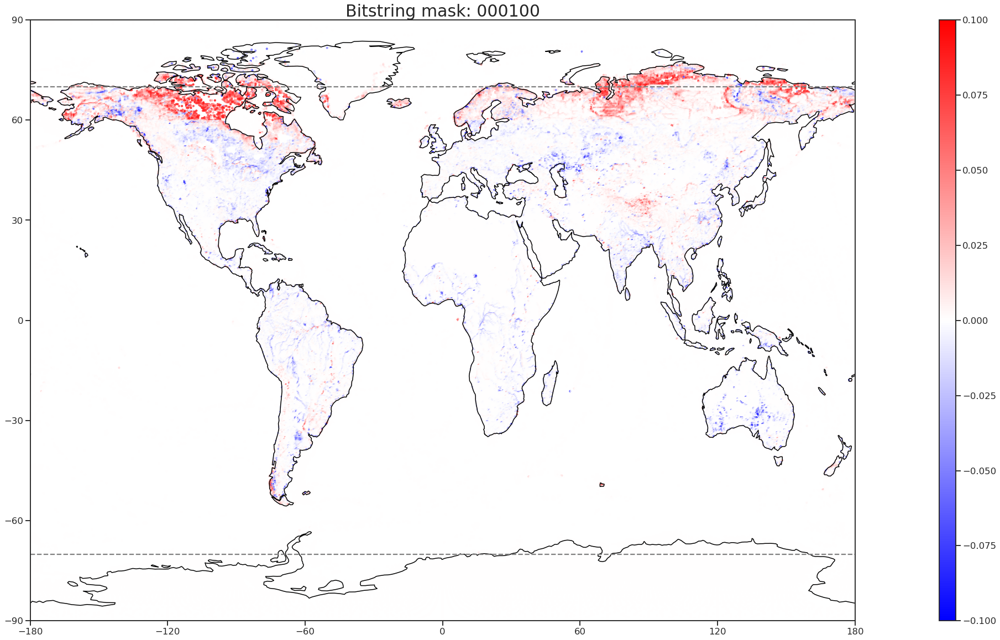

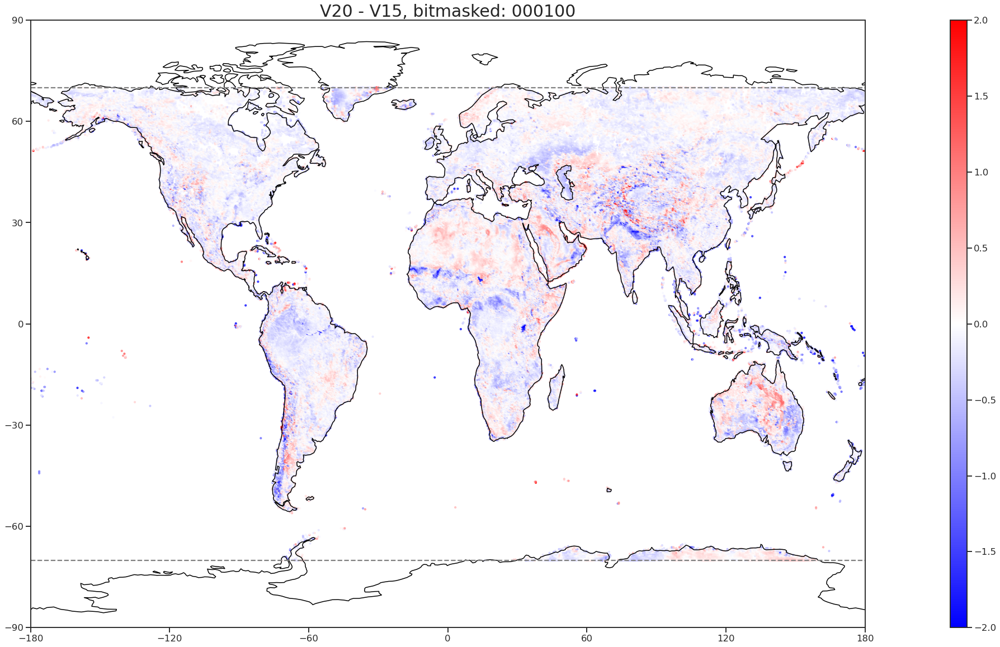

Number of samples: 135005
Distribution Mean/Median: -0.058467604 -0.045981765


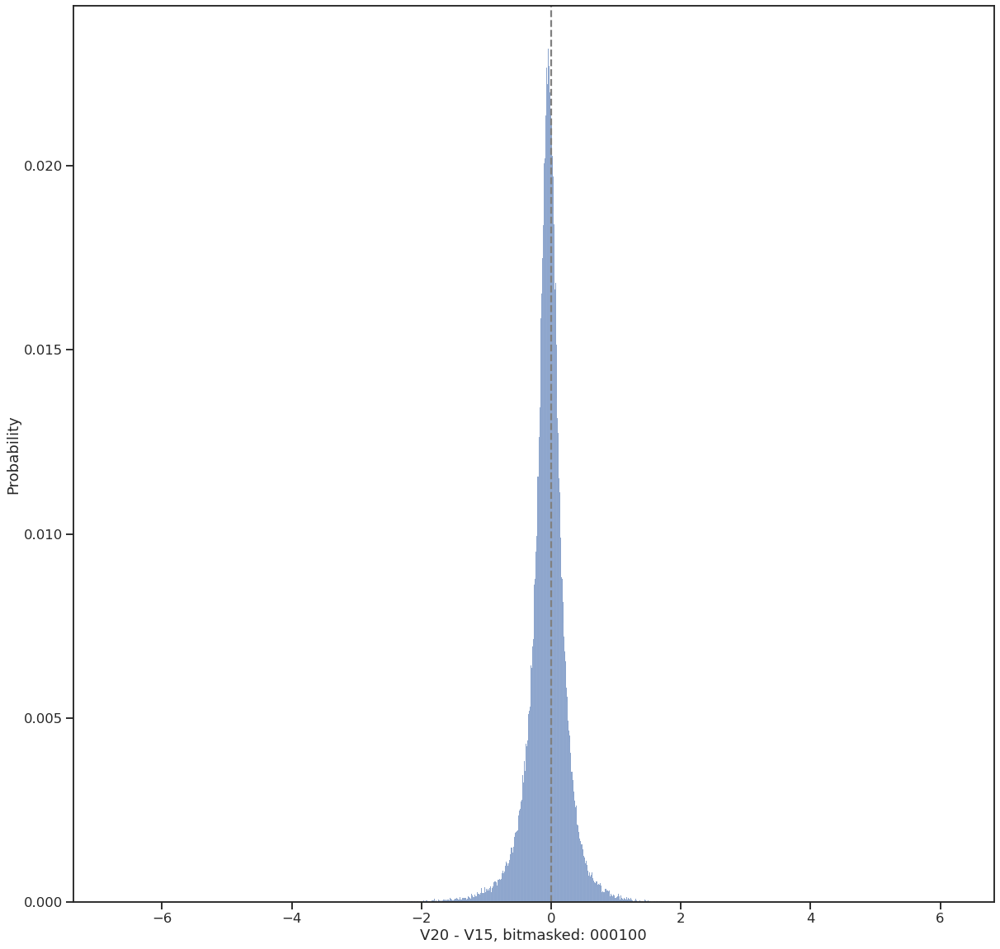

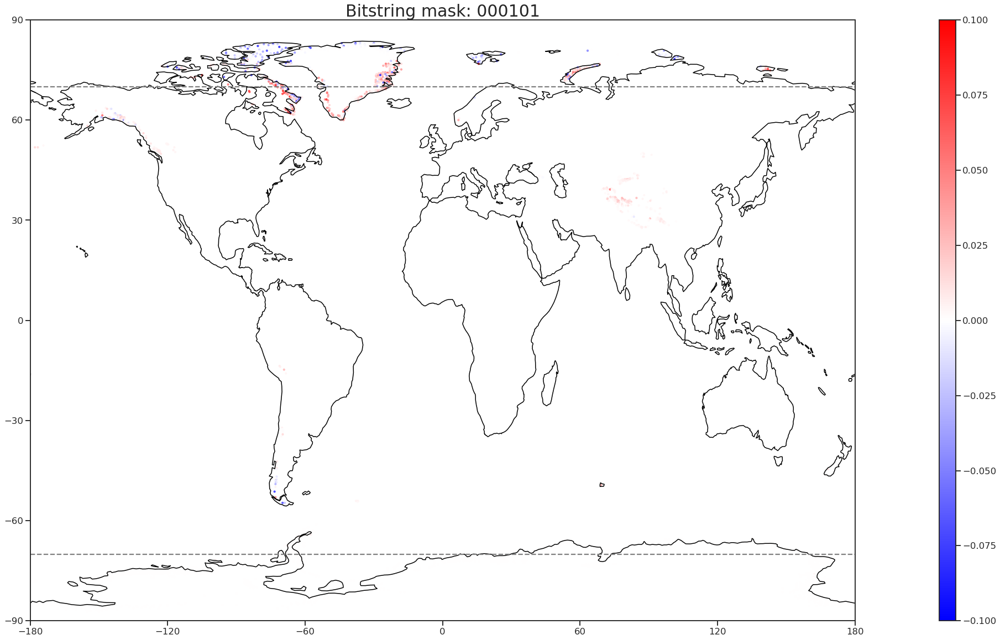

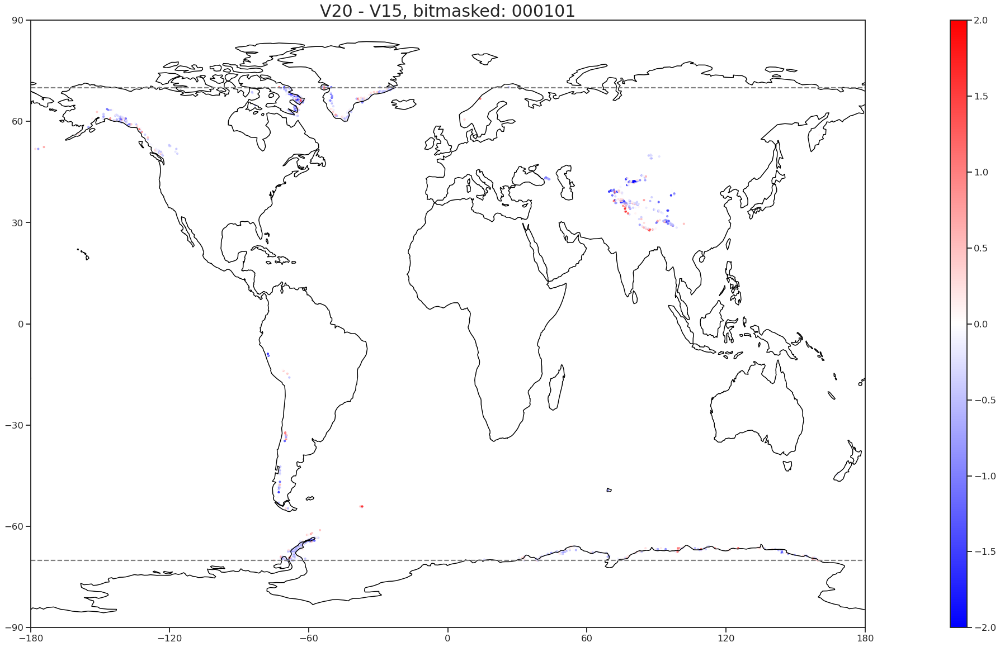

Number of samples: 834
Distribution Mean/Median: -0.31315032 -0.25835204


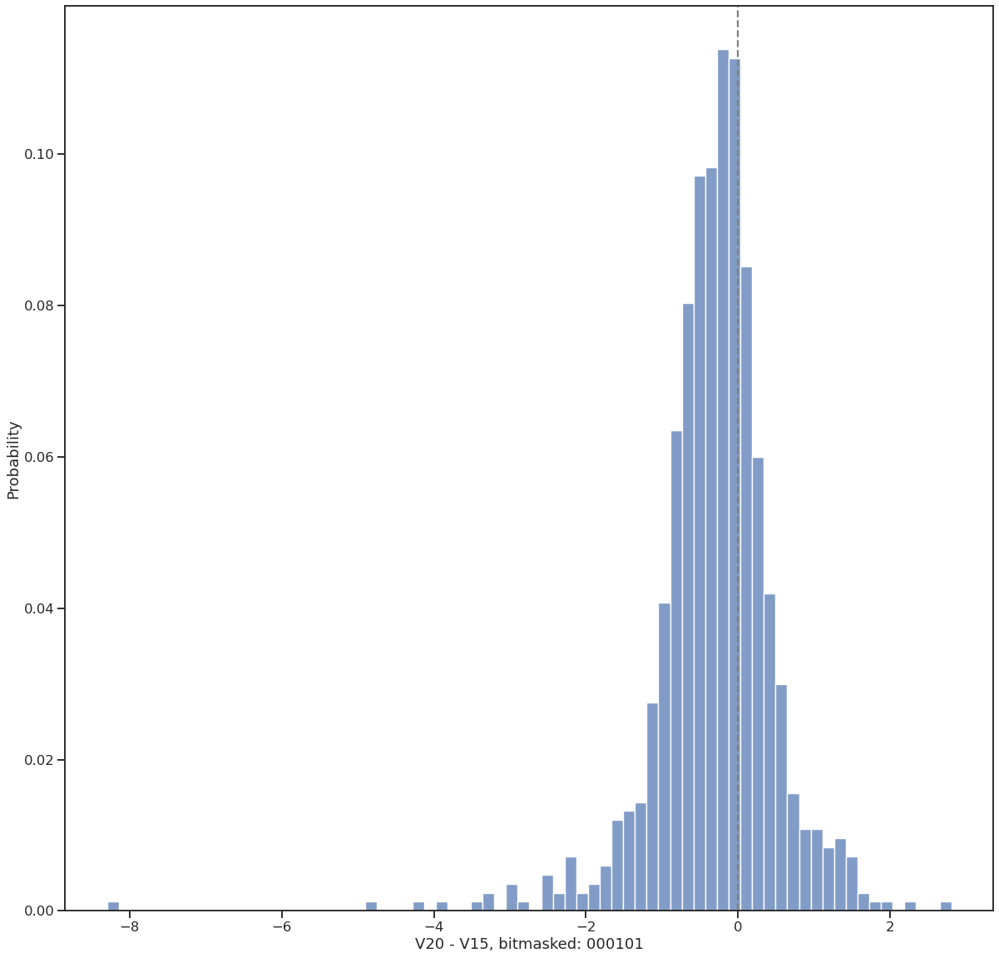

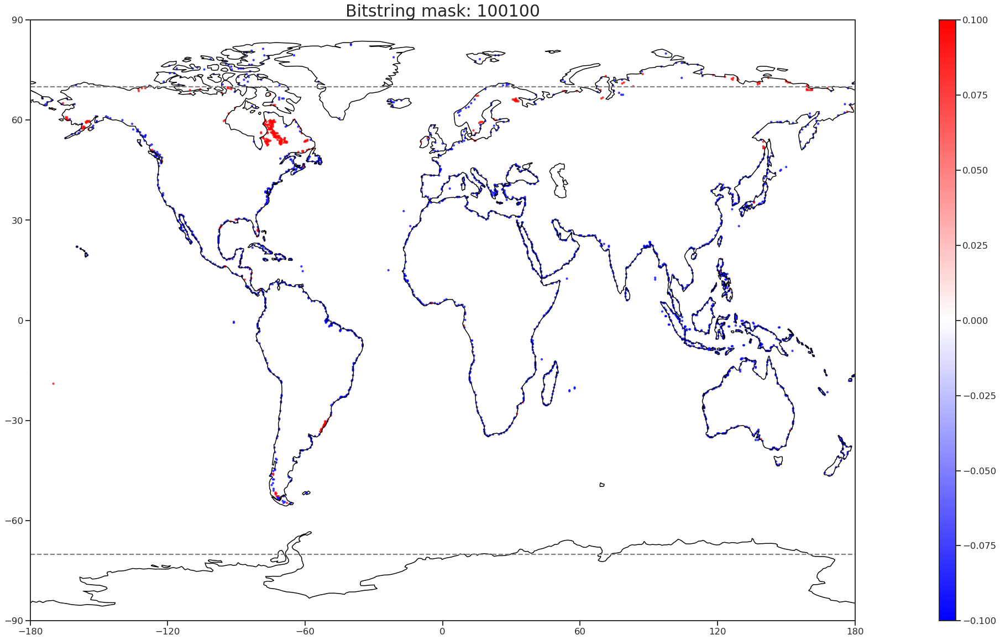

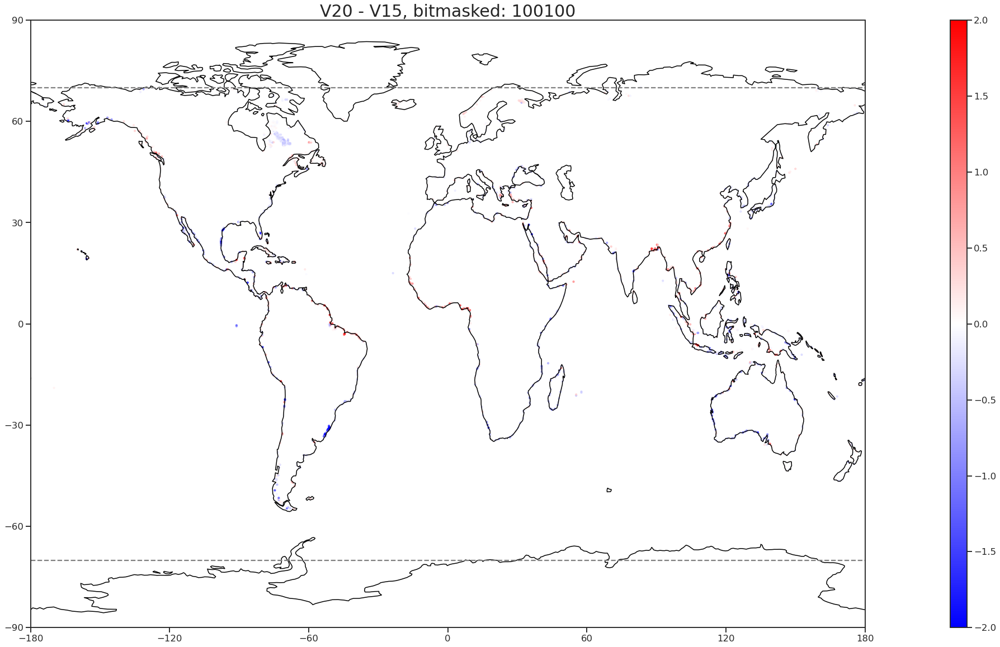

Number of samples: 2392
Distribution Mean/Median: -0.0712184 -0.035865188


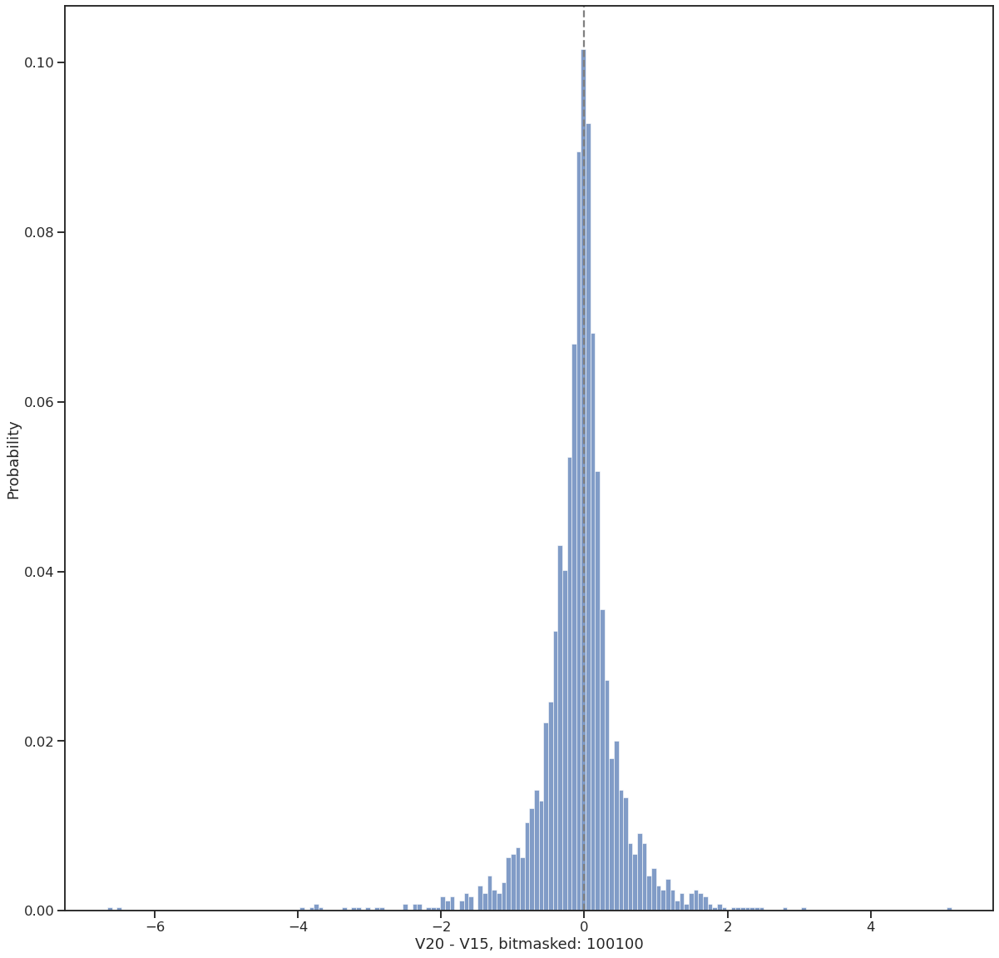

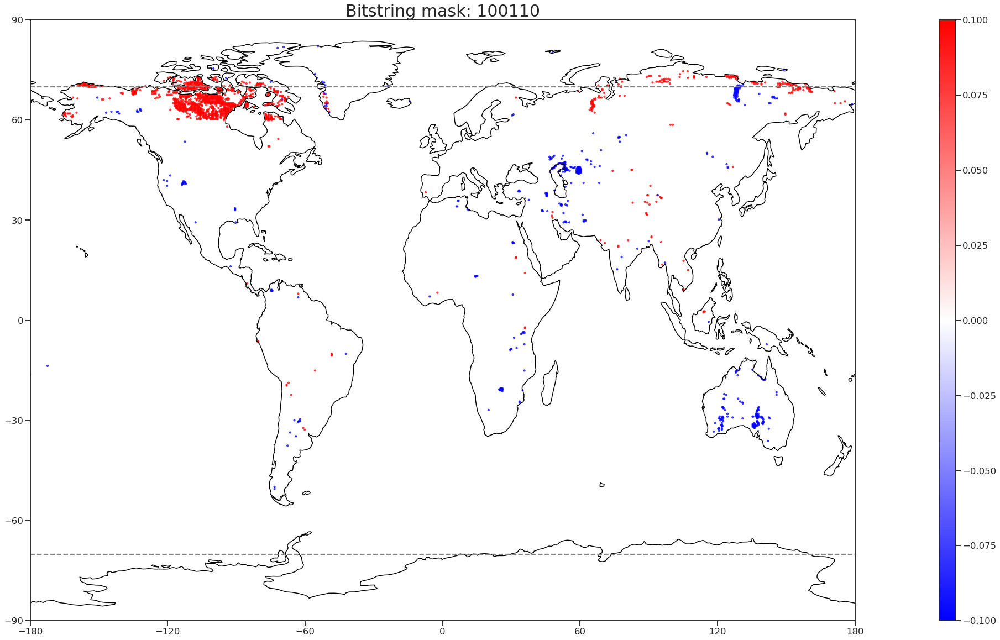

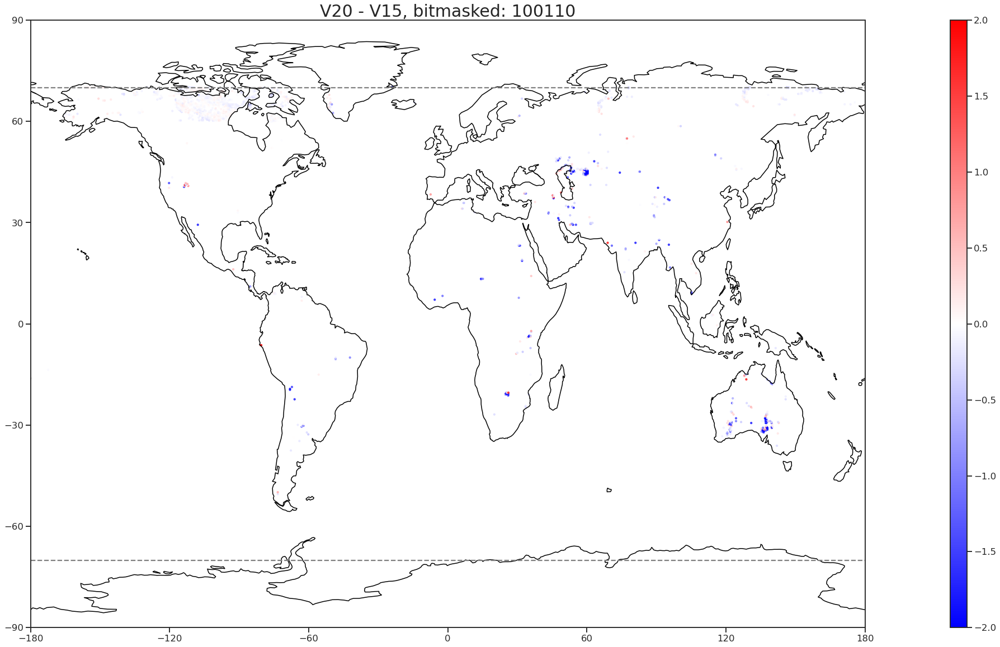

Number of samples: 1512
Distribution Mean/Median: -0.35980472 -0.044870257


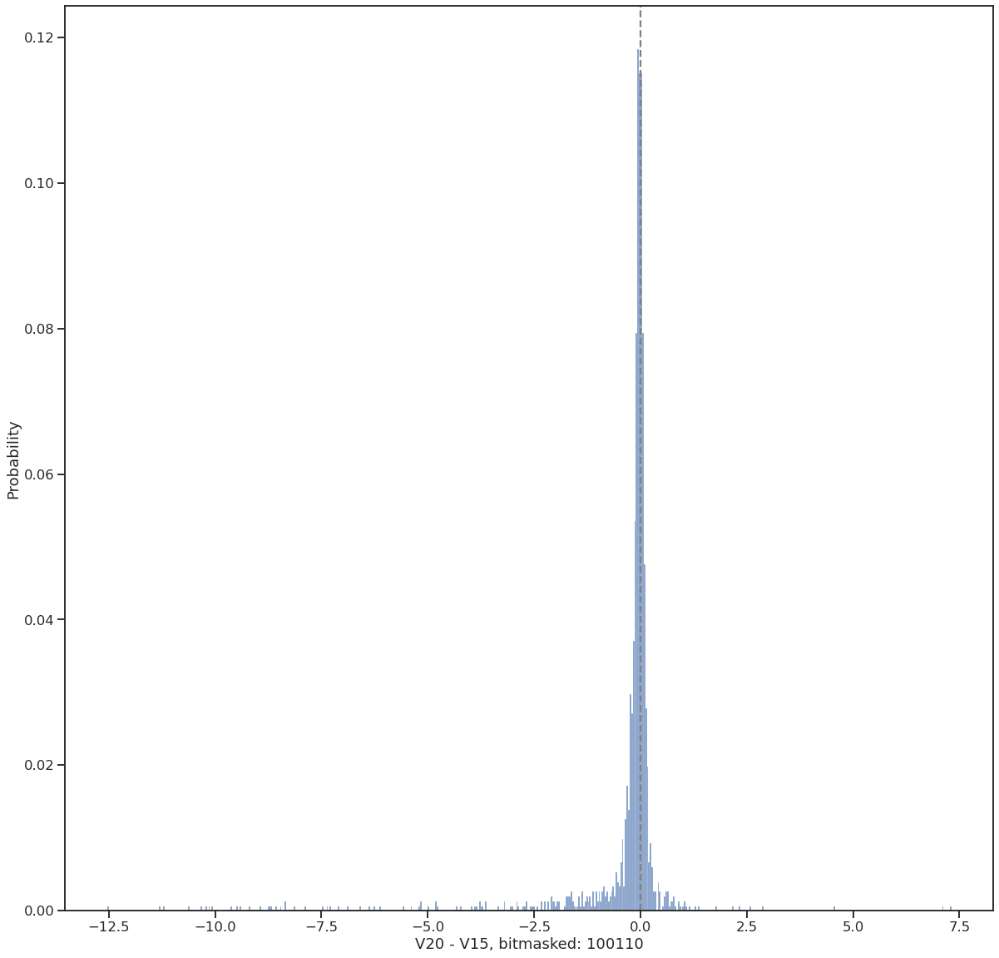

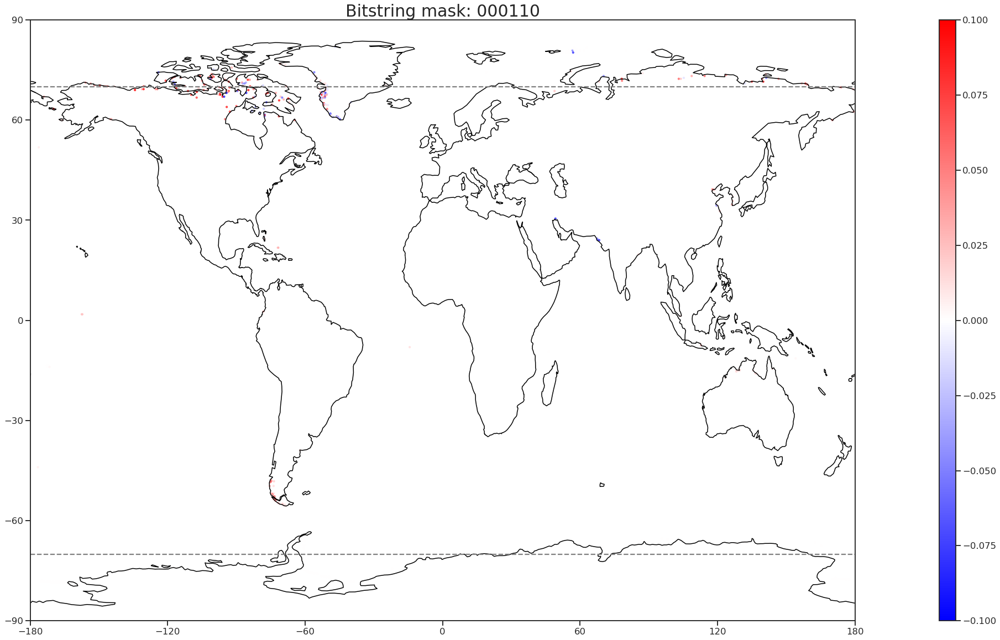

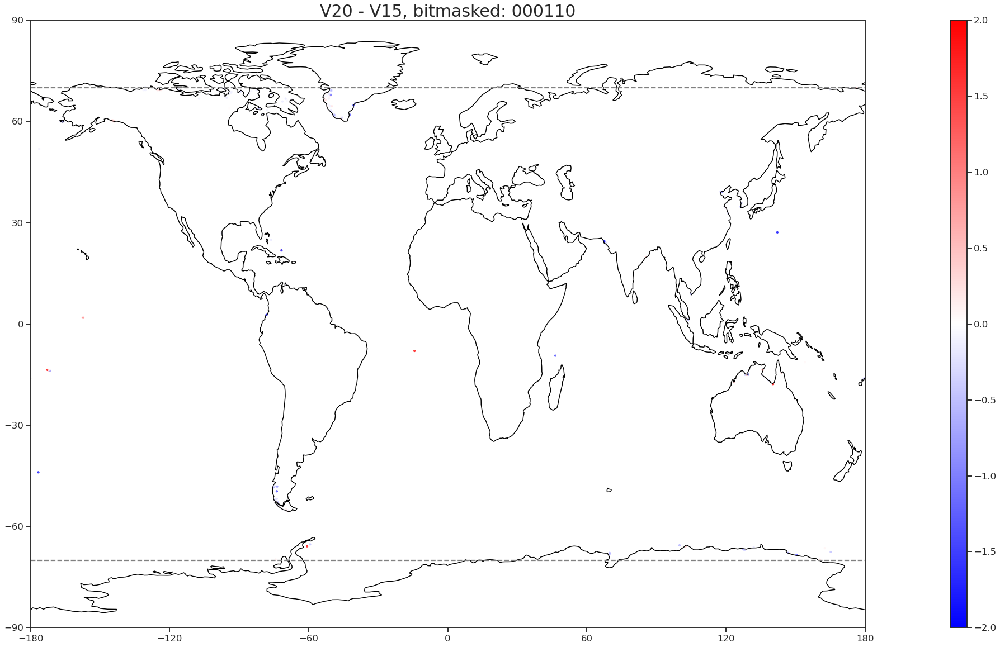

Number of samples: 247
Distribution Mean/Median: -0.15096031 -0.06408954


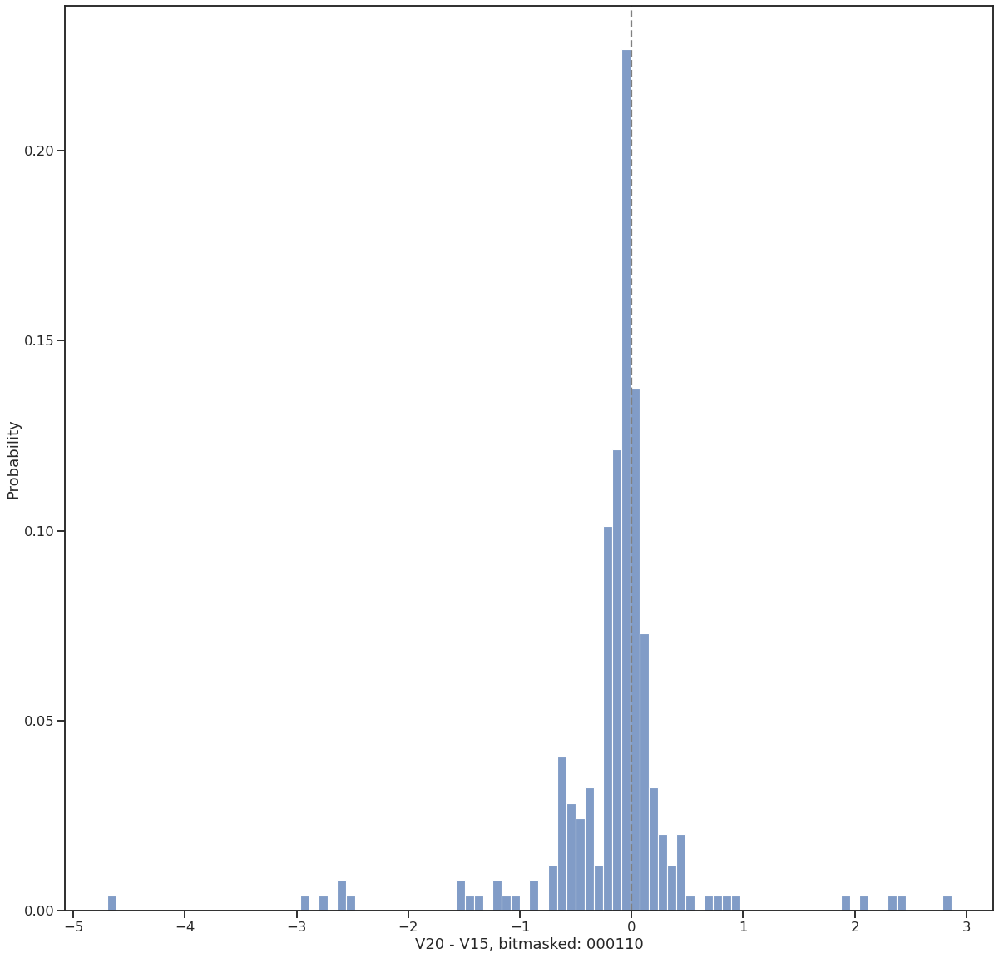

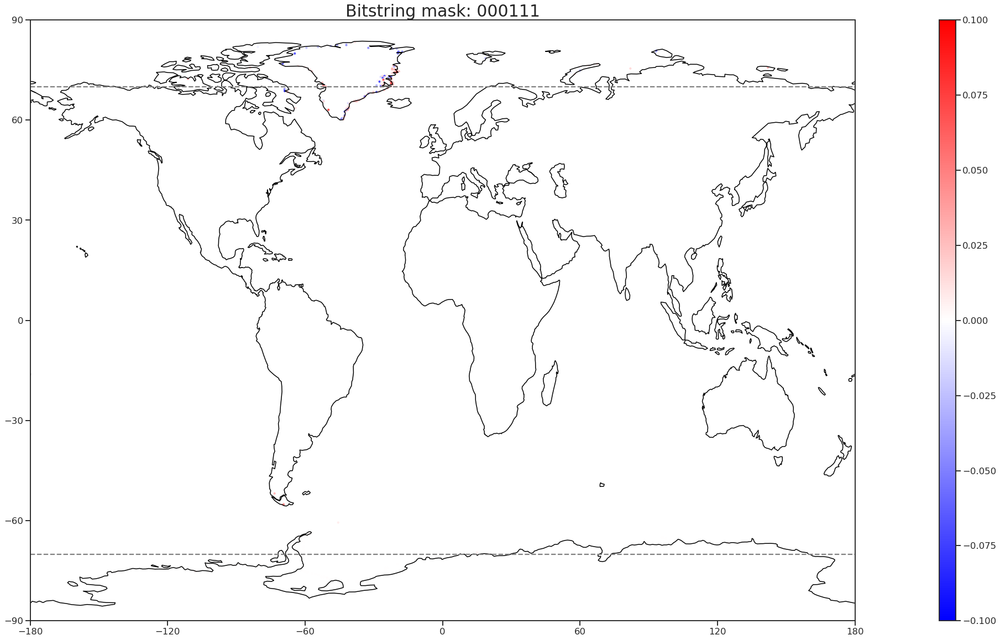

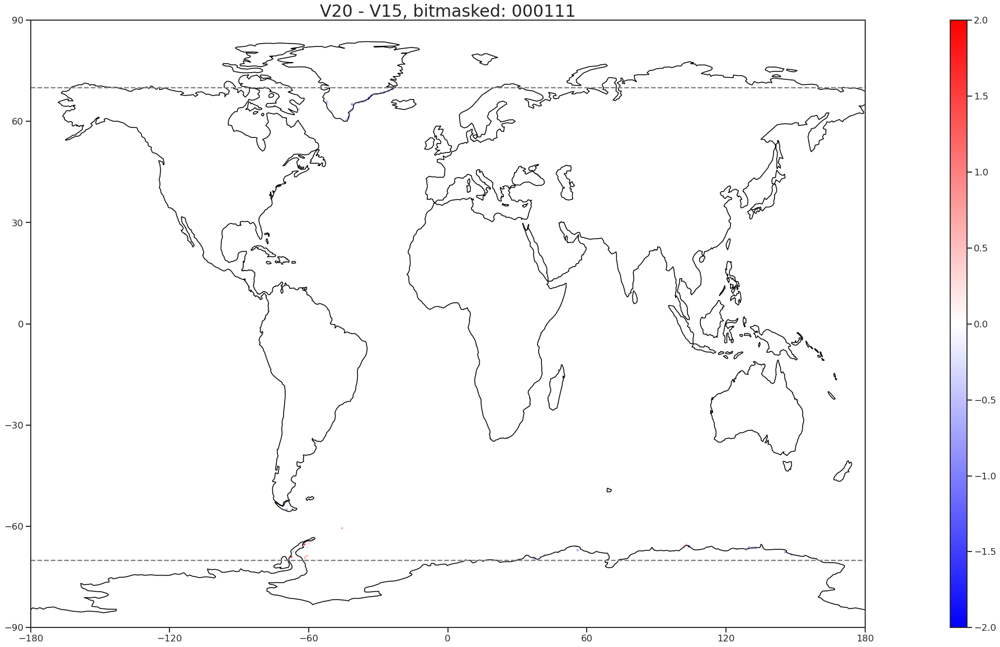

Number of samples: 114
Distribution Mean/Median: -0.17532559 -0.23740971


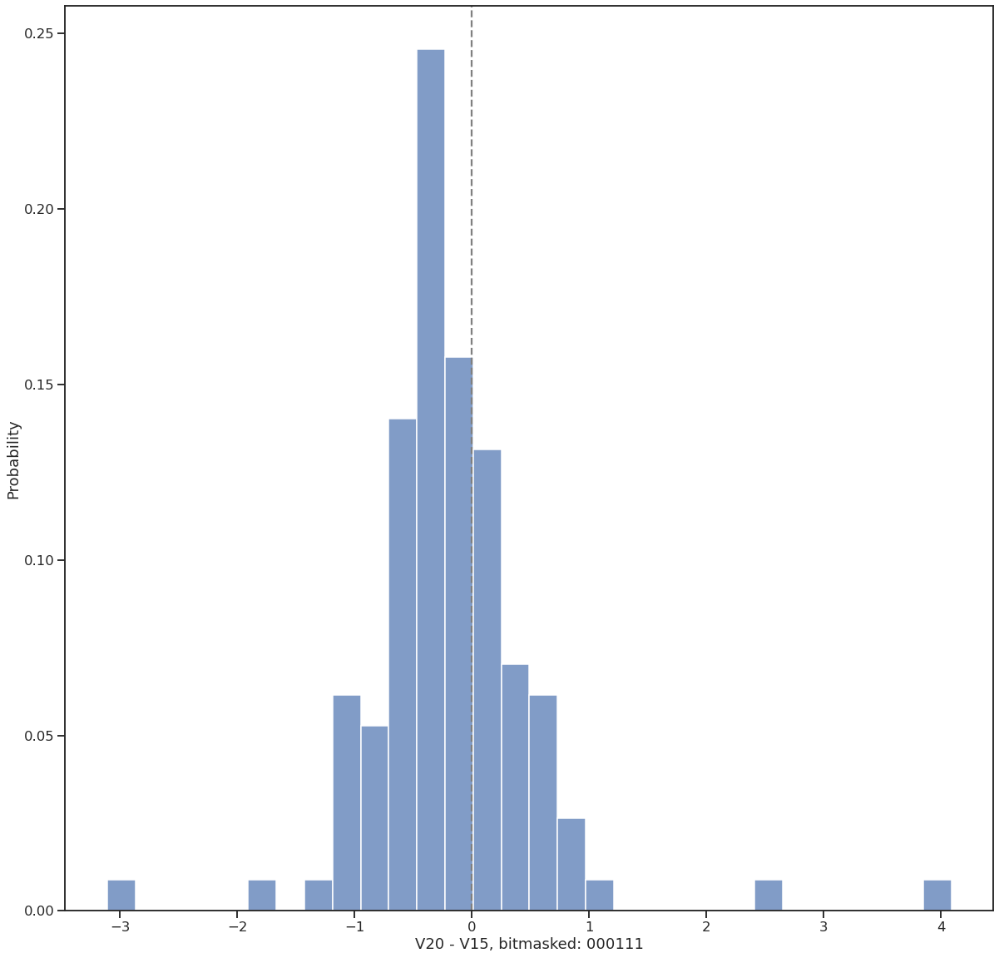

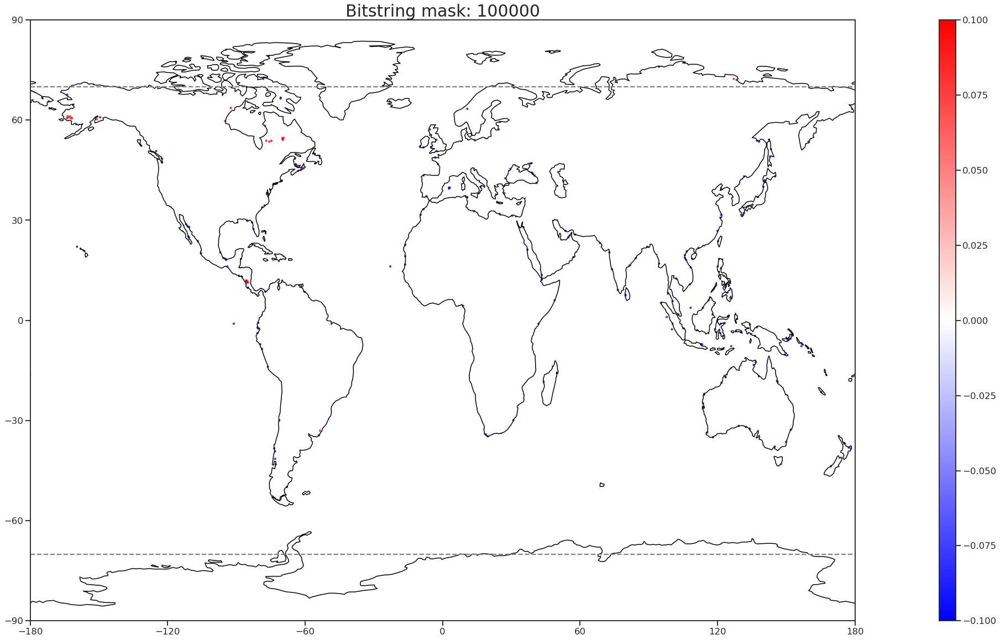

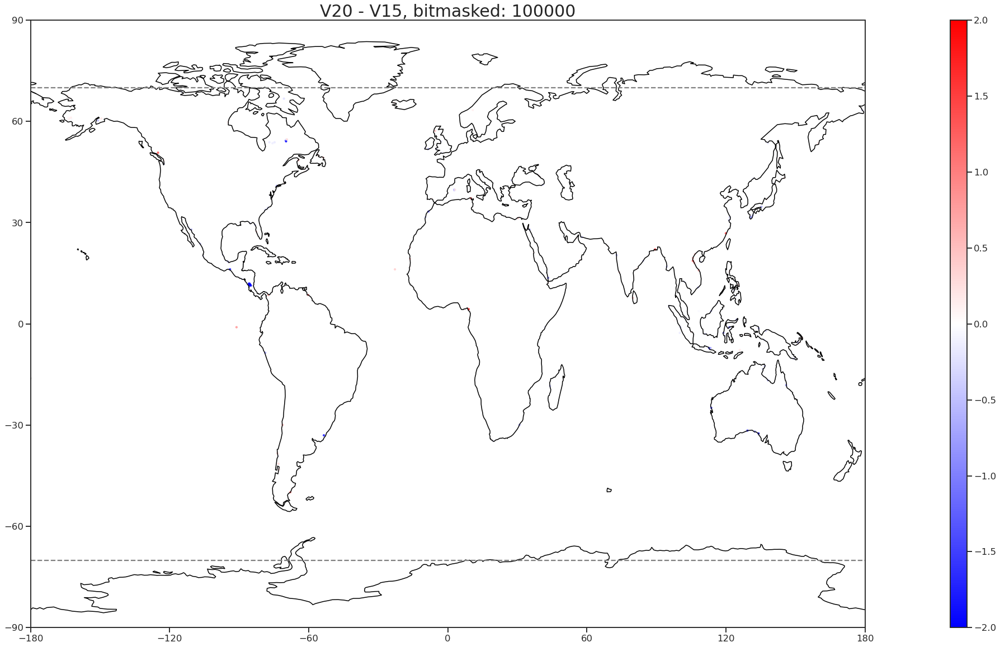

Number of samples: 234
Distribution Mean/Median: -0.22165592 -0.061493635


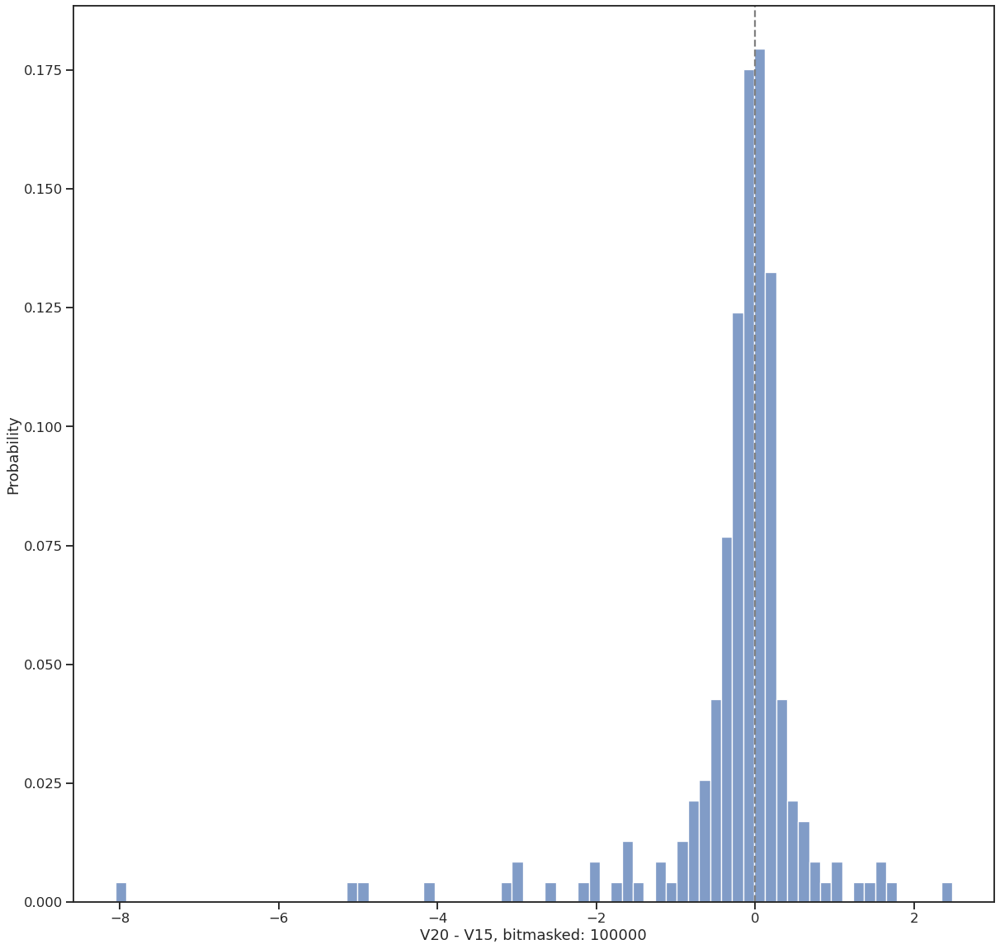

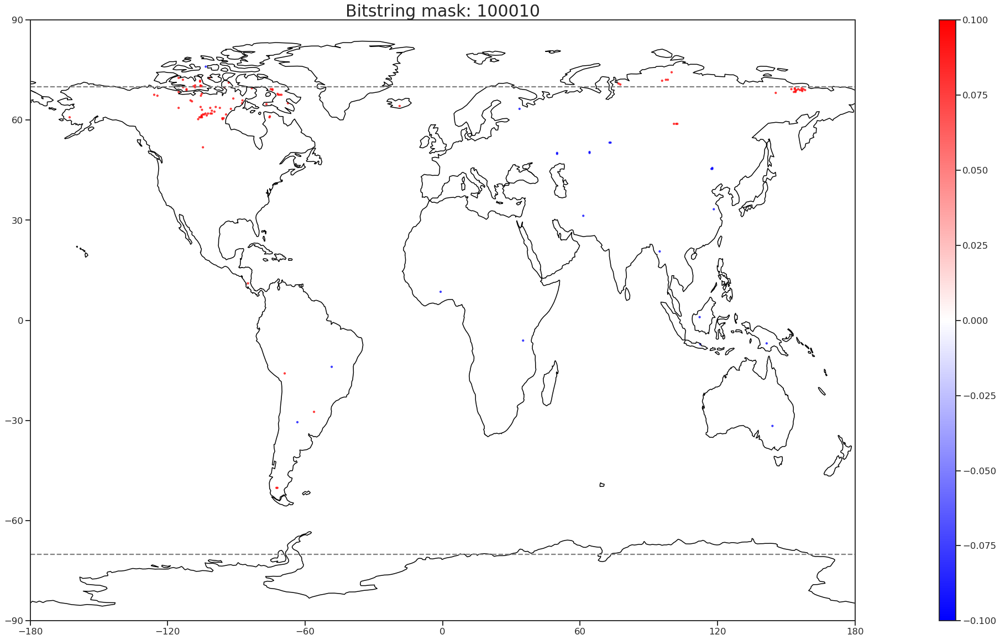

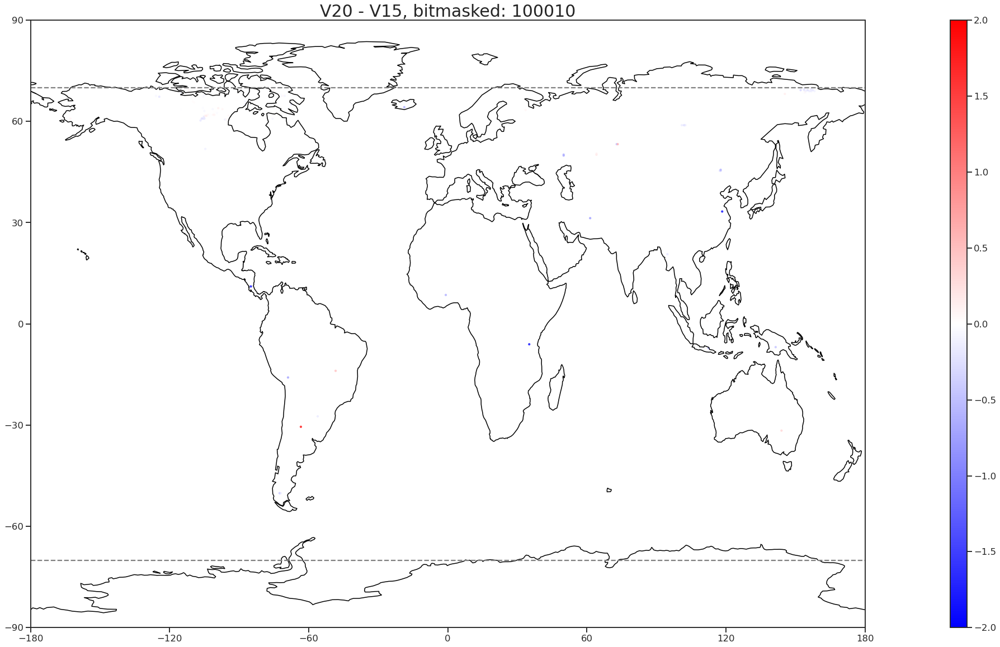

Number of samples: 104
Distribution Mean/Median: -0.1716798 -0.04389155


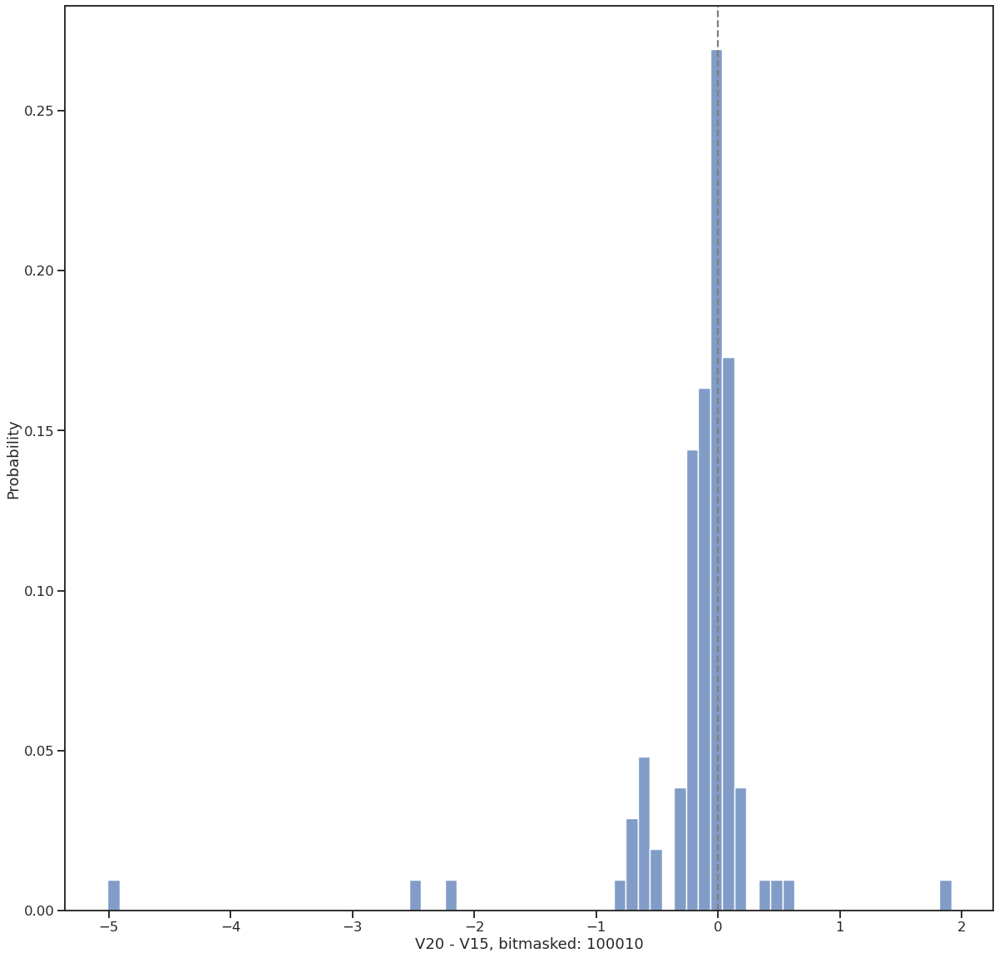

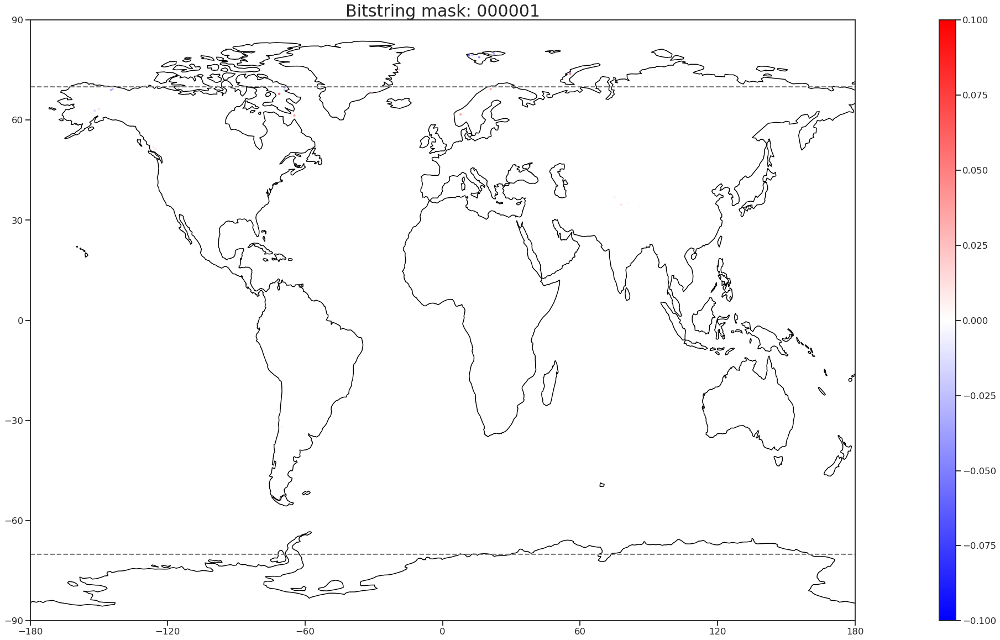

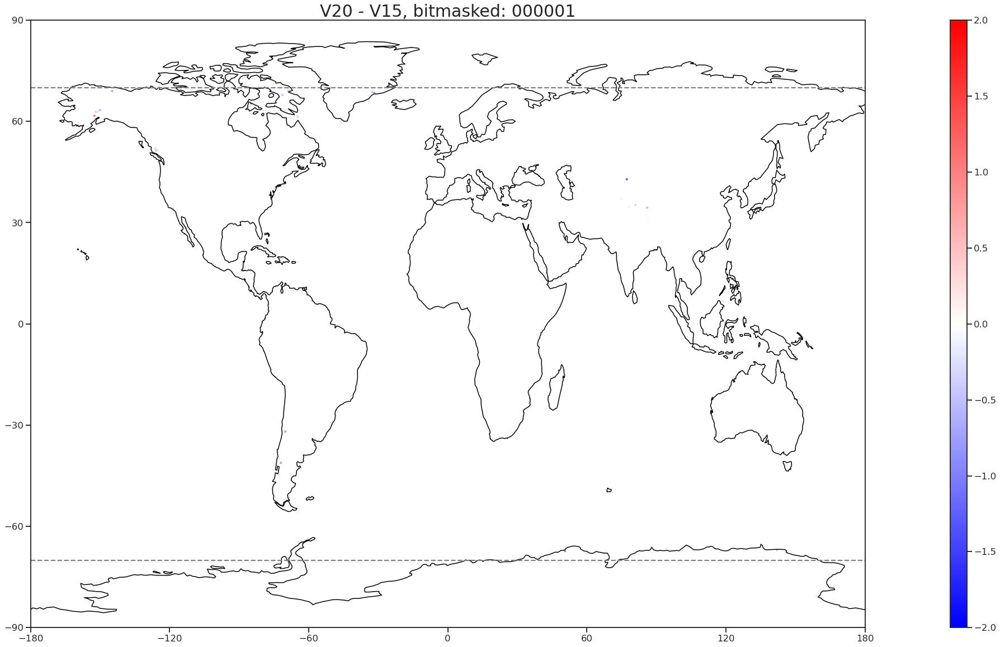

Number of samples: 43
Distribution Mean/Median: -0.22427373 -0.16517568


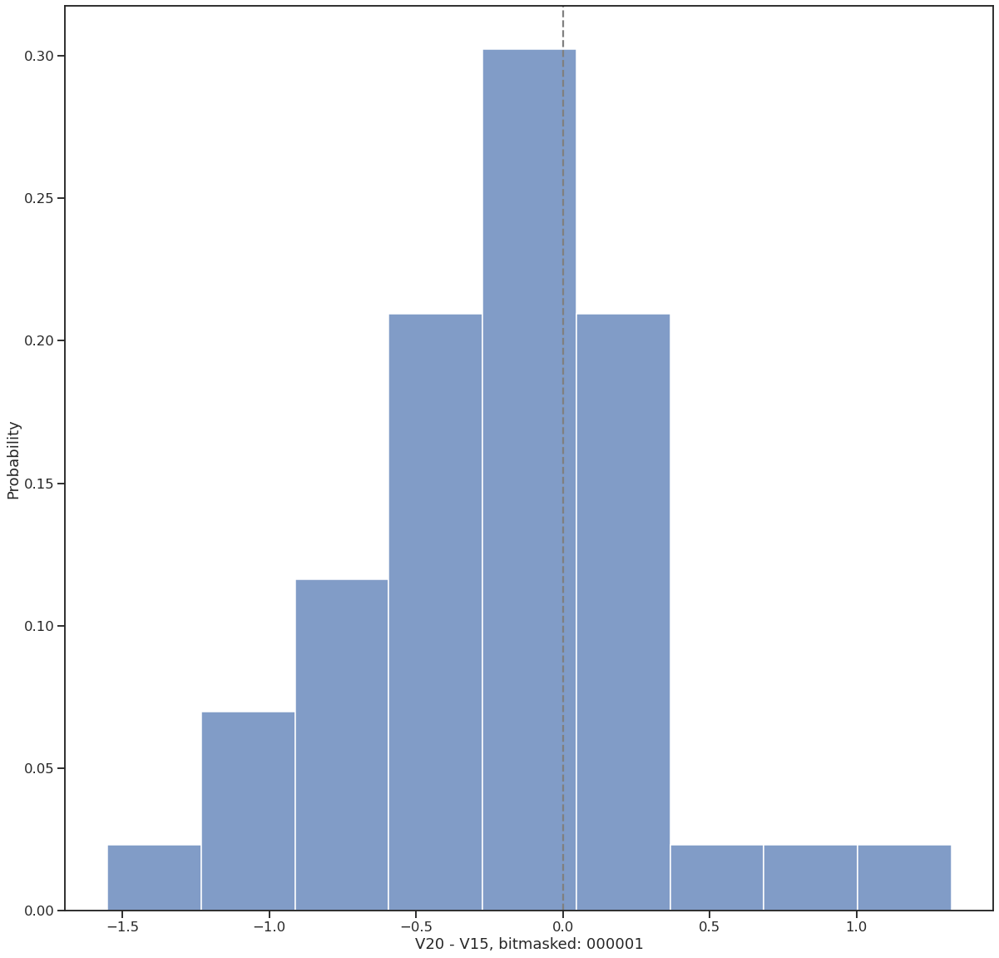

In [24]:
for p in list_of_bitstrings: 
    #Create a mask
    mask = change_in_fields.query(f'bitstring == "{p}"')
    
    
    #Plot the mask
    plot_map(mask,'change_in_cl',vmin=-0.1,vmax=0.1,cmap=plt.cm.bwr,logscale=False,title=f'Bitstring mask: {p}',limits=None,markersize=10,savefig=None) #What does this mask look like?


    #Apply the mask to the global error_delta_field from earlier
    V20_V15_masked = pd.merge(V20_V15,mask,how='inner',left_on=['latitude_ERA', 'longitude_ERA'], right_on=['latitude', 'longitude']) #inner join.
    
    if len(V20_V15_masked) == 0:
        print ('No values with this group')
        continue

    # Plot it, along with a distribution of the errors
    plot_map(V20_V15_masked,
             'delta',
             vmin=-2,vmax=2,
             cmap= plt.cm.bwr,
             logscale=False,
             title=f'V20 - V15, bitmasked: {p}',
             limits=None,
             markersize=10,
             savefig=None)


    plot_distribution(V20_V15_masked,'delta',f'V20 - V15, bitmasked: {p}')
    

## 1C. Noise

We have two options for evaluating the noise, one more stringent than the other:


* Look at all the points where nothing changed appreciably, i.e. the all zeros bitstring group
* Look at all the points where nothing changed AT ALL.

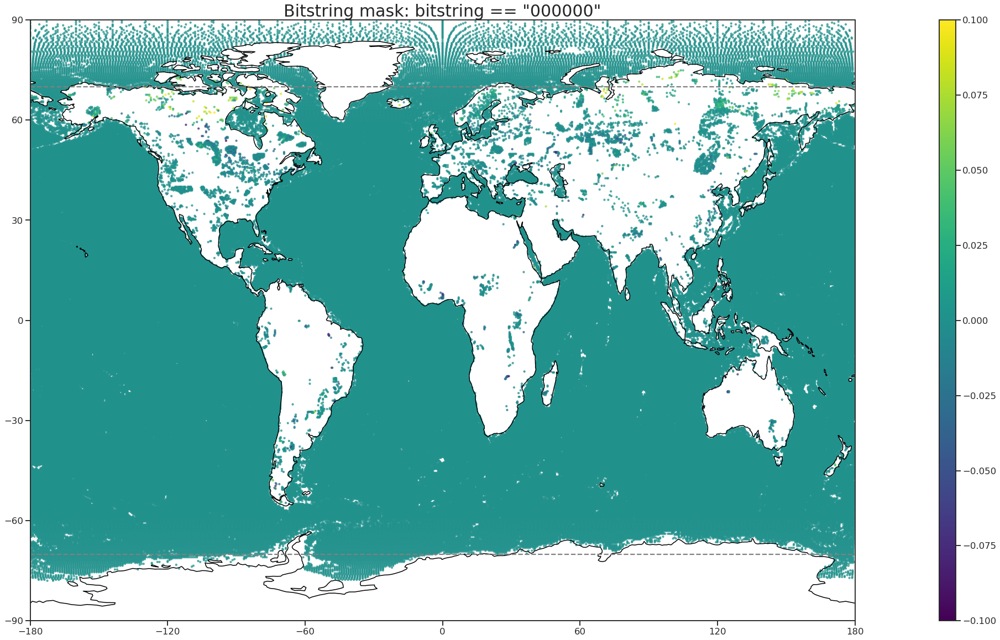

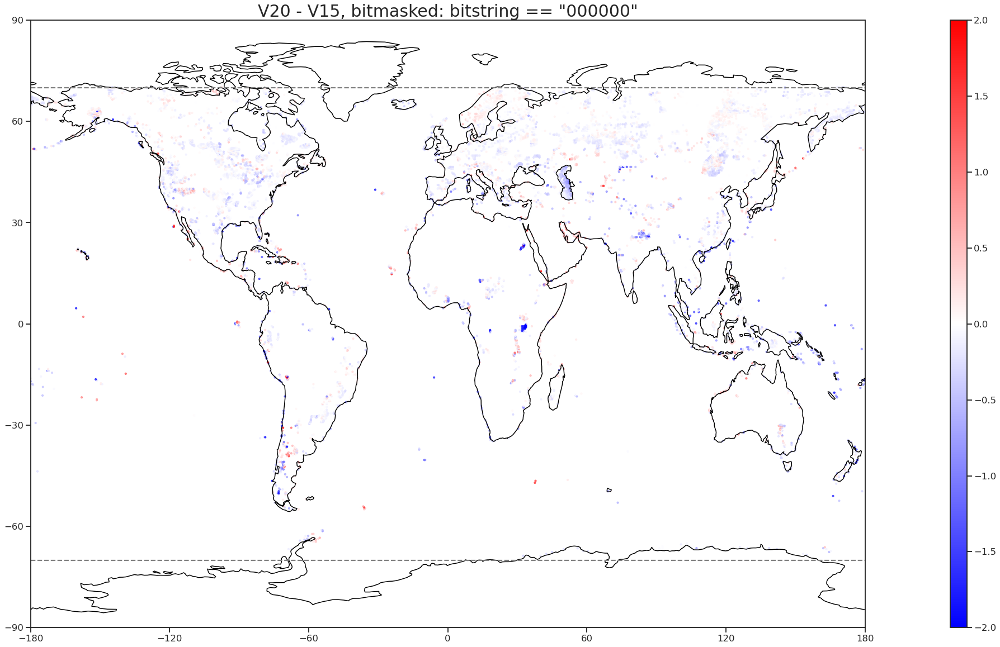

Number of samples: 9119
Distribution Mean/Median: -0.09307615 -0.060204983


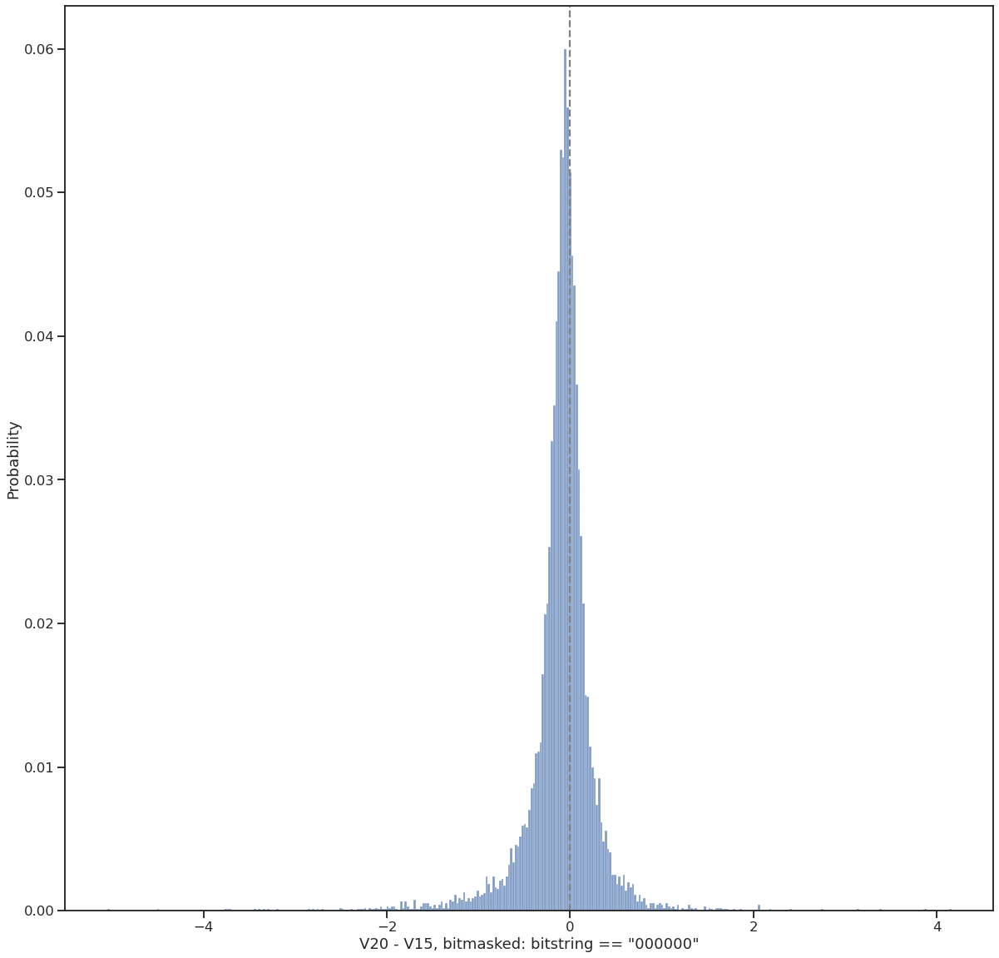

In [25]:
queries = ['bitstring == "000000"']

for p in queries:
    #Create a mask
    mask = change_in_fields.query(p)


    #Plot the mask
    plot_map(mask,'change_in_cl',vmin=-0.1,vmax=0.1,cmap=plt.cm.viridis,logscale=False,title=f'Bitstring mask: {p}',limits=None,markersize=10,savefig=None) #What does this mask look like?


    #Apply the mask to the global error_delta_field from earlier
    V20_V15_masked = pd.merge(V20_V15,mask,how='inner',left_on=['latitude_ERA', 'longitude_ERA'], right_on=['latitude', 'longitude']) #inner join.

    if len(V20_V15_masked) == 0:
        print ('No values with this group')
        continue

    # Plot it, along with a distribution of the errors
    plot_map(V20_V15_masked,
             'delta',
             vmin=-2,vmax=+2,
             cmap= plt.cm.bwr,
             logscale=False,
             title=f'V20 - V15, bitmasked: {p}',
             limits=None,
             markersize=10,
             savefig=None)


    plot_distribution(V20_V15_masked,'delta',f'V20 - V15, bitmasked: {p}')

In [101]:
mask = change_in_fields.copy()

#Apply the mask to the global error_delta_field from earlier
V20_V15_masked = pd.merge(V20_V15,mask,how='inner',left_on=['latitude_ERA', 'longitude_ERA'], right_on=['latitude', 'longitude']) #inner join.

In [40]:
V20_V15_masked.groupby(['bitstring']).count()

,latitude_ERA,longitude_ERA,MODIS_LST,V15_prediction,V20_prediction,V15_error,V20_error,delta,values,step,...,change_in_dl,V15_dl,V20_dl,percentage_change_in_dl,cl_change_is_significant,si10_change_is_significant,cvh_change_is_significant,cvl_change_is_significant,lsm_change_is_significant,dl_change_is_significant
bitstring,,,,,,,,,,,,,,,,,,,,,
000000,9119,9119,9119,9119,9119,9119,9119,9119,9119,9119,...,9119,9119,9119,9119,9119,9119,9119,9119,9119,9119
000001,43,43,43,43,43,43,43,43,43,43,...,43,43,43,43,43,43,43,43,43,43
000010,22,22,22,22,22,22,22,22,22,22,...,22,22,22,22,22,22,22,22,22,22
000011,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5
000100,135005,135005,135005,135005,135005,135005,135005,135005,135005,135005,...,135005,135005,135005,135005,135005,135005,135005,135005,135005,135005
000101,834,834,834,834,834,834,834,834,834,834,...,834,834,834,834,834,834,834,834,834,834
000110,247,247,247,247,247,247,247,247,247,247,...,247,247,247,247,247,247,247,247,247,247
000111,114,114,114,114,114,114,114,114,114,114,...,114,114,114,114,114,114,114,114,114,114
001000,8,8,8,8,8,8,8,8,8,8,...,8,8,8,8,8,8,8,8,8,8
